In [1]:
import osmnx as ox
import numpy as np
import pandas as pd
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.cm as cm
from matplotlib.colors import LinearSegmentedColormap, Normalize
import networkx as nx
import pandana
import keplergl
import IPython
import base64
from shapely import Point
import geopandas as gpd
import warnings
import folium
import mapclassify
from scipy.stats import kendalltau, pearsonr, spearmanr, linregress, stats
from statsmodels.formula.api import ols
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import shapiro, kstest, norm
import json

In [2]:
# Notebook themes
#!jt -l

In [3]:
# Notebook themes
#!jt -t chesterish
#!jt -t onedork -fs 115 -nfs 125 -tfs 115 -dfs 115 -ofs 115 -cursc r -cellw 80% -lineh 115 -altmd  -kl -T -N
#!jt -t monokai -f fira -fs 10 -nf ptsans -nfs 11 -N -kl -cursw 2 -cursc r -cellw 95% -T

#### Importing the network

In [4]:
place = 'Napoli, Italia'
G = ox.graph_from_place(place, network_type='walk', simplify = True)

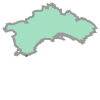

In [5]:
# Download the boundary of the city
city_polygon = ox.geocode_to_gdf(place)['geometry'].iloc[0]
city_polygon

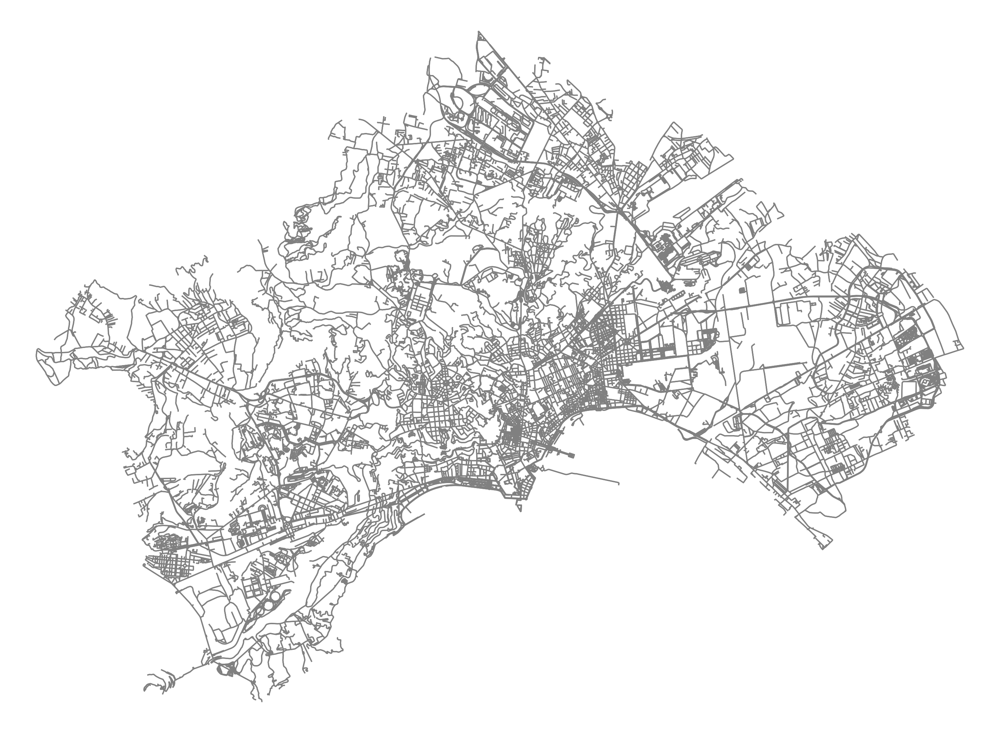

In [6]:
mpl.rcParams['figure.dpi'] = 500
#fig, ax = ox.plot_graph(ox.project_graph(G), node_color='#4CFFD6', node_size=0.5,
#                       edge_color='#4CFFD6', edge_linewidth=0.1, 
#                       figsize=(7, 7))

fig, ax = ox.plot_graph(ox.project_graph(G), 
                       figsize=(7, 7), node_size = 0, bgcolor="white", node_color = "black", 
                       edge_color='gray', edge_linewidth=0.5)


In [7]:
nodes, edges = ox.graph_to_gdfs(G, nodes = True, edges= True)

In [8]:
nodes.head(3)

,y,x,street_count,highway,geometry
osmid,,,,,
15588479,40.844128,14.184561,3,NaN,POINT (14.18456 40.84413)
15588483,40.847009,14.183698,3,NaN,POINT (14.18370 40.84701)
15588486,40.847125,14.183636,3,NaN,POINT (14.18364 40.84713)


In [9]:
edges#[edges.v == "3383248580"] #edges.head(3)

osmid  oneway         highway  \
u           v           key                                                  
15588479    15588578    0                  3211846   False  secondary_link   
            2633707866  0                 22789953   False       secondary   
            3383248580  0                 22789953   False       secondary   
15588483    15588486    0                 22789956   False       secondary   
            244924333   0    [22789957, 106802845]   False       secondary   
...                                            ...     ...             ...   
11989908172 11989880768 0               1293390439   False     residential   
11989958308 2191392298  0                208879864   False     residential   
            11989958309 0               1293397496   False    unclassified   
            2191392320  0                208879864   False     residential   
11989958309 11989958308 0               1293397496   False    unclassified   

                            reversed   length  \
u           v           key                     
15588479    15588578    0      False   17.538   
            2633707866  0      False   28.833   
            3383248580  0       True  106.575   
15588483    15588486    0       True   14.271   
            244924333   0      False   95.079   
...                              ...      ...   
11989908172 11989880768 0       True  125.604   
11989958308 2191392298  0       True   23.503   
            11989958309 0      False  102.743   
            2191392320  0      False   92.708   
11989958309 11989958308 0       True  102.743   

                                                                      geometry  \
u           v           key                                                      
15588479    15588578    0    LINESTRING (14.18456 40.84413, 14.18451 40.844...   
            2633707866  0    LINESTRING (14.18456 40.84413, 14.18448 40.844...   
            3383248580  0    LINESTRING (14.18456 40.84413, 14.18477 40.843...   
15588483    15588486    0    LINESTRING (14.18370 40.84701, 14.18366 40.847...   
            244924333   0    LINESTRING (14.18370 40.84701, 14.18362 40.846...   
...                                                                        ...   
11989908172 11989880768 0    LINESTRING (14.22158 40.89270, 14.22116 40.892...   
11989958308 2191392298  0    LINESTRING (14.30906 40.83448, 14.30887 40.83463)   
            11989958309 0    LINESTRING (14.30906 40.83448, 14.31009 40.83498)   
            2191392320  0    LINESTRING (14.30906 40.83448, 14.30909 40.834...   
11989958309 11989958308 0    LINESTRING (14.31009 40.83498, 14.30906 40.83448)   

                                                 name bridge    junction  \
u           v           key                                                
15588479    15588578    0                         NaN    NaN         NaN   
            2633707866  0    Via Vicinale Cupa Cintia    NaN         NaN   
            3383248580  0    Via Vicinale Cupa Cintia    NaN         NaN   
15588483    15588486    0                         NaN    yes  roundabout   
            244924333   0    Via Vicinale Cupa Cintia    yes         NaN   
...                                               ...    ...         ...   
11989908172 11989880768 0                  Cupa Coppa    NaN         NaN   
11989958308 2191392298  0       Via Taverna del Ferro    NaN         NaN   
            11989958309 0                         NaN    NaN         NaN   
            2191392320  0       Via Taverna del Ferro    NaN         NaN   
11989958309 11989958308 0                         NaN    NaN         NaN   

                            lanes  ref tunnel maxspeed width access est_width  \
u           v           key                                                     
15588479    15588578    0     NaN  NaN    NaN      NaN   NaN    NaN       NaN   
            2633707866  0     NaN  NaN    NaN      NaN   NaN    NaN       NaN   
            

##### Creating Pandana Graph for shortest path calculation

In [10]:
# FOR PANDANA
edges_pdna = edges.droplevel(level=2)
edges_pdna["from"] = edges_pdna.index.get_level_values("u")
edges_pdna["to"] = edges_pdna.index.get_level_values("v")
edges_pdna = edges_pdna.drop(['osmid', 'highway', "oneway", "reversed",
                "lanes", "name", "geometry", "maxspeed",
                "access", "junction", "width", "bridge",
                "tunnel", "service", "ref", "est_width", 
                "area"], axis=1)
edges_pdna.insert(2, "length", edges_pdna.pop("length"))
edges_pdna

from           to   length
u           v                                             
15588479    15588578        15588479     15588578   17.538
            2633707866      15588479   2633707866   28.833
            3383248580      15588479   3383248580  106.575
15588483    15588486        15588483     15588486   14.271
            244924333       15588483    244924333   95.079
...                              ...          ...      ...
11989908172 11989880768  11989908172  11989880768  125.604
11989958308 2191392298   11989958308   2191392298   23.503
            11989958309  11989958308  11989958309  102.743
            2191392320   11989958308   2191392320   92.708
11989958309 11989958308  11989958309  11989958308  102.743

[58218 rows x 3 columns]

In [11]:
nodes_pdna = nodes[["x", "y"]]

In [12]:
G_pdna = pandana.Network(nodes_pdna['x'], nodes_pdna['y'], 
                          edges_pdna['from'], edges_pdna['to'], 
                          edges_pdna[['length']], twoway = True)

#### Defining X minutes city

In [13]:
X_minutes = 15

#### Defining hotels (source nodes)

In [14]:
# Importing the complete hotel dataset

hotels_total = pd.read_excel("Napoli_listings_airbnb.xlsx", sheet_name = "listings_cleaned2")

hotels_total = hotels_total.rename(columns={'longitude': 'x_H', 'latitude': 'y_H', 
                                           "number_of_reviews": "review_count_H", "review_scores_rating": "score_H"})

hotels_total['amenities_count'] = hotels_total['amenities'].apply(lambda x: len(json.loads(x)))
hotels_total["name_H"] = range(1, len(hotels_total)+1)

In [15]:
# Classifying amenities

# Step-by-step flattening process
flattened_list = []
for json_str in hotels_total['amenities']:
    sentences = json.loads(json_str)  # Parse the JSON string
    flattened_list.extend(sentences)

# Find the unique sentences
unique_sentences = set(flattened_list)

# Convert the set to a list if needed
amenities_unique_sentences_list = list(unique_sentences)

#pd.DataFrame(amenities_unique_sentences_list).to_csv('amenities_unique_sentences_list.csv', index=False)

In [16]:
# Define categories

# Add the 'TVs' category
hotels_total['TVs'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword in json.loads(amenities) for keyword in ['TV', 'HDTV']) else 0
)

# Add the 'WiFi' category
hotels_total['Wifi'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword.lower() in amenity.lower() for amenity in json.loads(amenities) for keyword in ['wifi', 'WiFi']) else 0
)

# Add the 'Parking' category
hotels_total['Parking'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword.lower() in amenity.lower() for amenity in json.loads(amenities) for keyword in ['parking', 'Parking']) else 0
)

# Add the 'Kitchen Appliances' category
hotels_total['Kitchen_Appliances'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword.lower() in amenity.lower() for amenity in json.loads(amenities) for keyword in ['oven', 'stove', 'kitchen', 'coffee maker', 'refrigerator']) else 0
)

# Add the 'Bathroom Amenities' category
hotels_total['Bathroom_Amenities'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword.lower() in amenity.lower() for amenity in json.loads(amenities) for keyword in ['shampoo', 'conditioner', 'soap']) else 0
)

# Add the 'Child Amenities' category
hotels_total['Child_Amenities'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword.lower() in amenity.lower() for amenity in json.loads(amenities) for keyword in ['children', 'child', 'crib']) else 0
)

# Add the 'Entertainment Systems' category
hotels_total['Entertainment_Systems'] = hotels_total['amenities'].apply(
    lambda amenities: 1 if any(keyword.lower() in amenity.lower() for amenity in json.loads(amenities) for keyword in ['sound system', 'ping pong']) else 0
)

# Add the 'Miscellaneous' category
hotels_total['Miscellaneous'] = hotels_total.apply(
    lambda row: 1 if not any(row[category] for category in ['TVs', 'Wifi', 'Parking', 'Kitchen_Appliances', 'Bathroom_Amenities', 'Child_Amenities', 'Entertainment_Systems']) else 0,
    axis=1
)

In [17]:
hotels_total.head(3)

,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,x_H,property_type,room_type,...,amenities_count,name_H,TVs,Wifi,Parking,Kitchen_Appliances,Bathroom_Amenities,Child_Amenities,Entertainment_Systems,Miscellaneous
0,44165568,within an hour,0.9,0.97,f,San Giovanni a Teduccio,40.83701,14.31083,Entire rental unit,Entire home/apt,...,43,1,1,1,1,1,0,1,0,0
1,889784076873809685,within an hour,1.0,1.00,t,San Carlo all'Arena,40.86919,14.24636,Entire vacation home,Entire home/apt,...,57,2,1,1,1,1,1,1,0,0
2,41331148,within a few hours,1.0,1.00,f,Zona Industriale,40.85388,14.27435,Private room in rental unit,Private room,...,12,3,1,1,0,1,1,0,0,0


In [18]:
# Filtering accommodation by presence inside bbox
hotels_df = hotels_total.copy()
print("Total number of accomodation in city: ", len(hotels_df))

hotels_df['in_bbox'] = hotels_df.apply(lambda x: city_polygon.contains(Point(x.x_H, x.y_H)), axis=1)

hotels_df = hotels_df.loc[(hotels_df.in_bbox == True)].reset_index(drop=True)
hotels_df.drop("in_bbox", axis=1, inplace=True)
print("Number of hotels: ", len(hotels_df))
hotels_df.head(3)

Total number of accomodation in city:  7026
Number of hotels:  7020


,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,x_H,property_type,room_type,...,amenities_count,name_H,TVs,Wifi,Parking,Kitchen_Appliances,Bathroom_Amenities,Child_Amenities,Entertainment_Systems,Miscellaneous
0,44165568,within an hour,0.9,0.97,f,San Giovanni a Teduccio,40.83701,14.31083,Entire rental unit,Entire home/apt,...,43,1,1,1,1,1,0,1,0,0
1,889784076873809685,within an hour,1.0,1.00,t,San Carlo all'Arena,40.86919,14.24636,Entire vacation home,Entire home/apt,...,57,2,1,1,1,1,1,1,0,0
2,41331148,within a few hours,1.0,1.00,f,Zona Industriale,40.85388,14.27435,Private room in rental unit,Private room,...,12,3,1,1,0,1,1,0,0,0


In [19]:
# Getting the nearest node ids to each hotel

id_nearest_node_H, dist_H = ox.distance.nearest_nodes(G, hotels_df['x_H'], 
                                              hotels_df['y_H'], 
                                              return_dist=True)

print("Successful mapping: ", len(hotels_df) == len(id_nearest_node_H))


hotels_df.insert(7, "id_nearest_node_H", id_nearest_node_H)
hotels_df.insert(8, "x_nearest_node_H", 
                 np.float64(nodes.x[id_nearest_node_H]))
hotels_df.insert(9, "y_nearest_node_H", 
                 np.float64(nodes.y[id_nearest_node_H]))

hotels_df.head(3)

Successful mapping:  True


,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,id_nearest_node_H,x_nearest_node_H,y_nearest_node_H,...,amenities_count,name_H,TVs,Wifi,Parking,Kitchen_Appliances,Bathroom_Amenities,Child_Amenities,Entertainment_Systems,Miscellaneous
0,44165568,within an hour,0.9,0.97,f,San Giovanni a Teduccio,40.83701,2192300965,14.310937,40.836602,...,43,1,1,1,1,1,0,1,0,0
1,889784076873809685,within an hour,1.0,1.00,t,San Carlo all'Arena,40.86919,8811411905,14.245949,40.869495,...,57,2,1,1,1,1,1,1,0,0
2,41331148,within a few hours,1.0,1.00,f,Zona Industriale,40.85388,6886777291,14.273996,40.854110,...,12,3,1,1,0,1,1,0,0,0


(Mean, Std):  28.0 23.6


<Axes: >

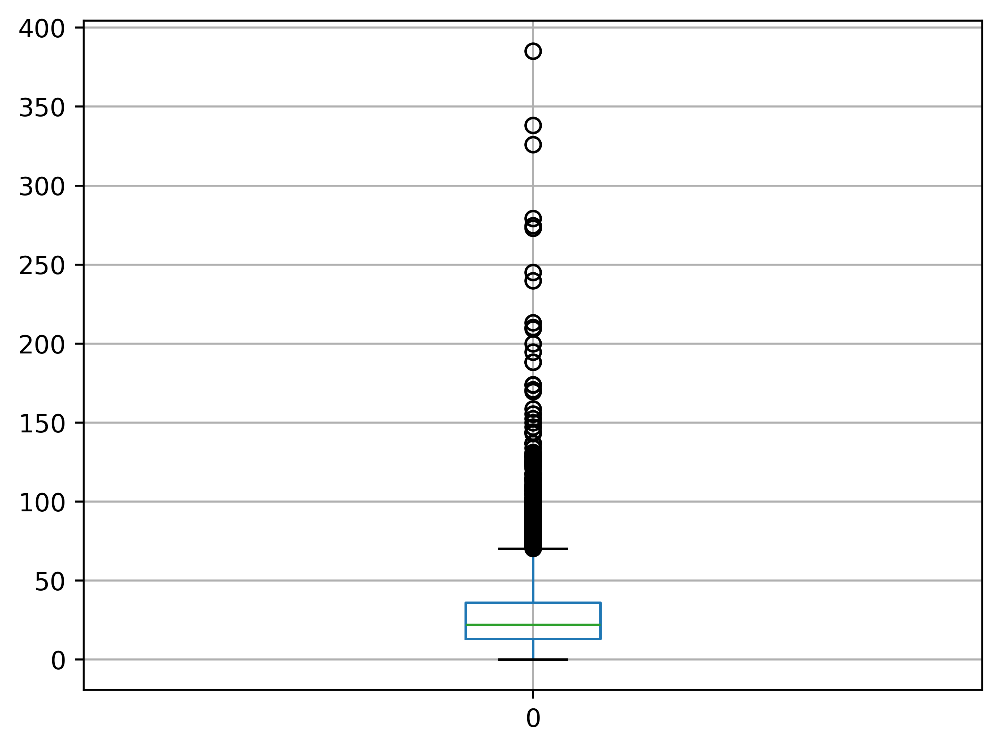

In [20]:
# Distribution of distance
print("(Mean, Std): ", np.around(np.mean(dist_H), decimals=1), np.around(np.std(dist_H), decimals=1))
pd.DataFrame(dist_H).boxplot()

Text(0, 0.5, 'review score')

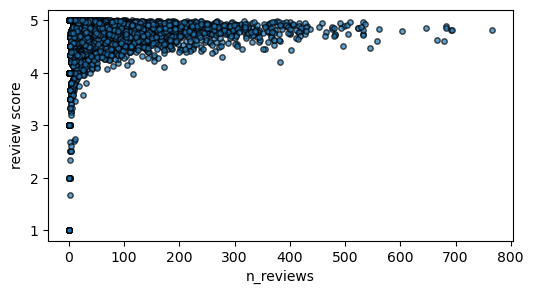

In [21]:
# Distribution of reviews as a function of number of reviews
# for the hotels
mpl.rcParams['figure.dpi'] = 100
fig, ax = plt.subplots(figsize = (6, 3))
ax.scatter(hotels_df["review_count_H"], hotels_df["score_H"], 
           s=15, alpha=0.7, edgecolors="k")
#ax.set_xscale("log")
ax.set_xlabel("n_reviews")
ax.set_ylabel("review score")

In [22]:
# Calculating Bayesian Average
#m = np.mean(hotels_df.score_H[hotels_df["score_H"] > 0])
#C = 250
#hotels_df["Bayesian_avg_H"] = ((hotels_df.score_H * hotels_df.review_count_H) 
#                                  + (C * m)) / (C + hotels_df.review_count_H)

S = np.mean(hotels_df.score_H[hotels_df["score_H"] > 0])
m_avg = np.mean(hotels_df.review_count_H[hotels_df["score_H"] > 0])

hotels_df["Bayesian_avg_H"] = (hotels_df.review_count_H/(hotels_df.review_count_H + m_avg)) * hotels_df.score_H +\
                                (m_avg/(hotels_df.review_count_H + m_avg)) * S
hotels_df = hotels_df[(hotels_df.score_H > 0) & (hotels_df.review_count_H > 0)]
print("Number of accommodations: ", len(hotels_df))
hotels_df.head(3)

Number of accommodations:  7020


,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,id_nearest_node_H,x_nearest_node_H,y_nearest_node_H,...,name_H,TVs,Wifi,Parking,Kitchen_Appliances,Bathroom_Amenities,Child_Amenities,Entertainment_Systems,Miscellaneous,Bayesian_avg_H
0,44165568,within an hour,0.9,0.97,f,San Giovanni a Teduccio,40.83701,2192300965,14.310937,40.836602,...,1,1,1,1,1,0,1,0,0,4.548627
1,889784076873809685,within an hour,1.0,1.00,t,San Carlo all'Arena,40.86919,8811411905,14.245949,40.869495,...,2,1,1,1,1,1,1,0,0,4.822223
2,41331148,within a few hours,1.0,1.00,f,Zona Industriale,40.85388,6886777291,14.273996,40.854110,...,3,1,1,0,1,1,0,0,0,4.743390


<Axes: xlabel='Accommodation type', ylabel='Count'>

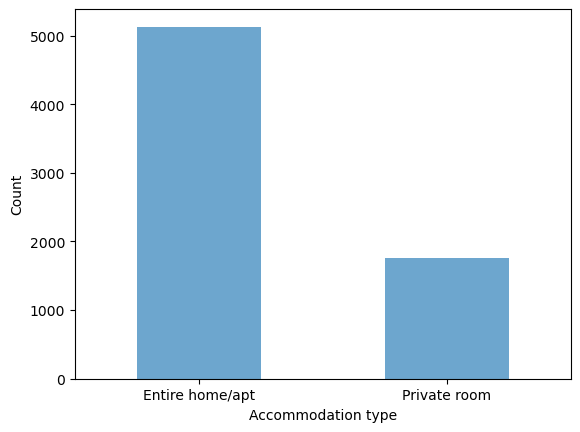

In [23]:
pd.DataFrame(hotels_df[(hotels_df.room_type == "Entire home/apt") | (hotels_df.room_type == "Private room")].room_type.sort_values().value_counts(sort=True)).plot.bar(alpha=0.65, xlabel="Accommodation type", ylabel="Count", rot=0, legend=False)

In [23]:
pd.DataFrame(hotels_df[(hotels_df.room_type == "Entire home/apt") | (hotels_df.room_type == "Private room")].room_type.sort_values().value_counts(sort=True))

,count
room_type,
Entire home/apt,5130
Private room,1757


#### Defining attractions (destination nodes)

In [24]:
# Importing the complete attractions dataset
attractions_col_names = ["gcode_A", "dcode_A", "name_A", "score_A", "review_count_A", 
                         "x_A", "y_A", "istat_pro_com_A", "municipality_A"] 

attractions_total = pd.read_excel("attraction_dataset.xlsx", sheet_name = "attraction_dataset", 
                                  names = attractions_col_names)

attractions_total.head(3)

,gcode_A,dcode_A,name_A,score_A,review_count_A,x_A,y_A,istat_pro_com_A,municipality_A
0,g187785,d2161503,Galleria Borbonica,5.0,10365,14.246260,40.835520,63049,Napoli
1,g187867,d269082,Cappella degli Scrovegni,5.0,7170,11.879536,45.411818,28060,Padova
2,g187867,d8660480,Villa Molin,5.0,35,11.840058,45.362549,28060,Padova


In [25]:
# Filtering attractions by municipality and presence inside bbox
attractions_df = attractions_total.copy()
attractions_df['in_bbox'] = attractions_df.apply(lambda x: city_polygon.contains(Point(x.x_A, x.y_A)), axis=1)
attractions_df = attractions_df.loc[(attractions_df.municipality_A == "Napoli") &
                                   (attractions_df.in_bbox == True)].reset_index(drop=True)
attractions_df.drop("in_bbox", axis=1, inplace=True)
print("Number of attractions: ", len(attractions_df))
attractions_df.head(3)

Number of attractions:  790


,gcode_A,dcode_A,name_A,score_A,review_count_A,x_A,y_A,istat_pro_com_A,municipality_A
0,g187785,d2161503,Galleria Borbonica,5.0,10365,14.246260,40.835520,63049,Napoli
1,g187785,d243315,Catacombe di San Gennaro,5.0,5680,14.247445,40.865059,63049,Napoli
2,g187785,d4063391,Catacombe di San Gaudioso,5.0,1659,14.249435,40.859502,63049,Napoli


Text(0, 0.5, 'review score')

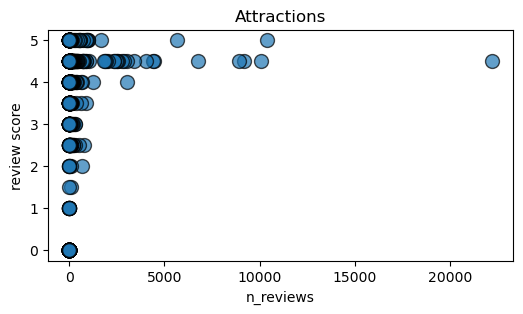

In [26]:
# Distribution of reviews as a function of number of reviews
# for the attractions
fig, ax = plt.subplots(figsize = (6, 3))
ax.scatter(attractions_df["review_count_A"], attractions_df["score_A"], 
           s=100, alpha=0.7, edgecolors="k")
#ax.set_xscale("log")
ax.set_title("Attractions")
ax.set_xlabel("n_reviews")
ax.set_ylabel("review score")

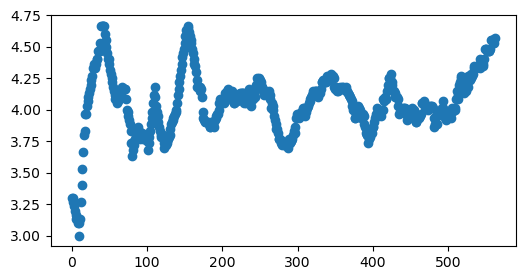

In [27]:
window = 30
j = window - 1
moving_avg = []
df_score = attractions_df.sort_values('review_count_A', ascending = True)
df_score = df_score[df_score["review_count_A"] > 0]
idx = range(0, len(df_score))
for i in idx:
    moving_avg.append(np.mean(df_score.score_A[i:window]))
    window += 1
    if window > len(idx):
        break

fig, ax = plt.subplots(figsize = (6, 3))
#ax.set_xscale("log")
ax.scatter(idx[:-j], moving_avg)    
#ax.set(ylim=(0, 0.000025))

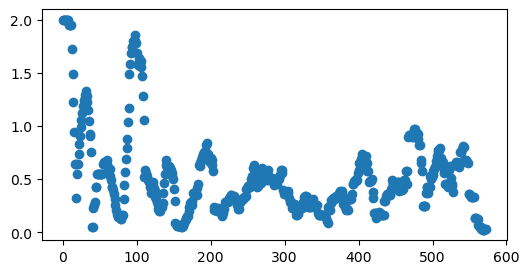

In [28]:
window = 20
j = window - 1
moving_var = []
df_score = attractions_df.sort_values('review_count_A', ascending = True)
df_score = df_score[df_score["review_count_A"] > 0]
idx = range(0, len(df_score))
for i in idx:
    moving_var.append(np.var(df_score.score_A[i:window]))
    window += 1
    if window > len(idx):
        break

fig, ax = plt.subplots(figsize = (6, 3))
#ax.set_xscale("log")
ax.scatter(idx[:-j], moving_var)    
#ax.set(ylim=(0, 0.000025))

In [29]:
# Calculating Bayesian Average for attractions
#m = np.mean(attractions_df.score_A[attractions_df["score_A"] > 0])
#C = 100
#attractions_df["Bayesian_avg_A"] = ((attractions_df.score_A * attractions_df.review_count_A) 
#                                  + (C * m)) / (C + attractions_df.review_count_A)

S = np.mean(attractions_df.score_A[attractions_df["score_A"] > 0])
m_avg = np.mean(attractions_df.review_count_A[attractions_df["score_A"] > 0])

attractions_df["Bayesian_avg_A"] = (attractions_df.review_count_A/(attractions_df.review_count_A + m_avg)) * attractions_df.score_A +\
                                (m_avg/(attractions_df.review_count_A + m_avg)) * S
attractions_df = attractions_df[(attractions_df.score_A > 0) & (attractions_df.review_count_A > 0)]
print("Number of attractions: ", len(attractions_df))
attractions_df.head(10)

Number of attractions:  592


,gcode_A,dcode_A,name_A,score_A,review_count_A,x_A,y_A,istat_pro_com_A,municipality_A,Bayesian_avg_A
0,g187785,d2161503,Galleria Borbonica,5.0,10365,14.246260,40.835520,63049,Napoli,4.975244
1,g187785,d243315,Catacombe di San Gennaro,5.0,5680,14.247445,40.865059,63049,Napoli,4.955772
2,g187785,d4063391,Catacombe di San Gaudioso,5.0,1659,14.249435,40.859502,63049,Napoli,4.863877
3,g187785,d10025055,Museo delle Arti Sanitarie,5.0,1002,14.254908,40.854090,63049,Napoli,4.793913
4,g187785,d3580580,Parco Archeologico Pausilypon - World Heritage...,5.0,981,14.176582,40.799774,63049,Napoli,4.790470
5,g187785,d12396492,Napulitanata,5.0,933,14.250652,40.852951,63049,Napoli,4.782153
6,g187785,d195431,SantAnna dei Lombardi (Monteoliveto) - World H...,5.0,873,14.250546,40.845287,63049,Napoli,4.770780
7,g187785,d16878926,Chiesa Museo di Santa Luciella ai Librai,5.0,860,14.257575,40.849505,63049,Napoli,4.768158
8,g187785,d3398103,MUSA - Museo Universitario delle Scienze e del...,5.0,714,14.255550,40.853351,63049,Napoli,4.733976
9,g187785,d2100869,La Chiesa Di San Giovanni A Carbonara,5.0,574,14.262206,40.854873,63049,Napoli,4.690174


In [30]:
# Getting the nearest node ids to each attraction

id_nearest_node_A, dist_A = ox.distance.nearest_nodes(G, attractions_df['x_A'], 
                                              attractions_df['y_A'], 
                                              return_dist=True)

print("Successful mapping: ", len(attractions_df) == len(id_nearest_node_A))


attractions_df.insert(7, "id_nearest_node_A", id_nearest_node_A)
attractions_df.insert(8, "x_nearest_node_A", 
                 np.float64(nodes.x[id_nearest_node_A]))
attractions_df.insert(9, "y_nearest_node_A", 
                 np.float64(nodes.y[id_nearest_node_A]))

attractions_df.head(3)

Successful mapping:  True


,gcode_A,dcode_A,name_A,score_A,review_count_A,x_A,y_A,id_nearest_node_A,x_nearest_node_A,y_nearest_node_A,istat_pro_com_A,municipality_A,Bayesian_avg_A
0,g187785,d2161503,Galleria Borbonica,5.0,10365,14.246260,40.835520,11308084483,14.246211,40.835659,63049,Napoli,4.975244
1,g187785,d243315,Catacombe di San Gennaro,5.0,5680,14.247445,40.865059,10837559380,14.247246,40.865090,63049,Napoli,4.955772
2,g187785,d4063391,Catacombe di San Gaudioso,5.0,1659,14.249435,40.859502,2272682955,14.249568,40.859413,63049,Napoli,4.863877


(Mean, Std):  24.0 33.8


<Axes: >

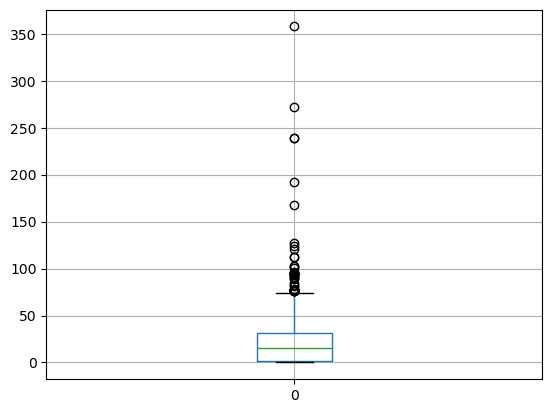

In [31]:
# Distribution of distance
print("(Mean, Std): ", np.around(np.mean(dist_A), decimals=1), np.around(np.std(dist_A), decimals=1))
pd.DataFrame(dist_A).boxplot()

In [32]:
# Filtering top-k attractions based on Bayesian avg.
k = len(attractions_df[attractions_df.Bayesian_avg_A >= 4]) #150 #   len(attractions_df)
top_k_A_df = attractions_df.sort_values('Bayesian_avg_A', ascending = False)[0:k]
top_k_A_df.reset_index(drop = True, inplace=True)

#fig, ax = plt.subplots(figsize = (8, 6))
#ax.scatter(np.arange(1, 376 , dtype=int), top_k_A_df.Bayesian_avg) 

top_k_A_df[["name_A", "score_A", "review_count_A", "Bayesian_avg_A"]].head(10)

,name_A,score_A,review_count_A,Bayesian_avg_A
0,Galleria Borbonica,5.0,10365,4.975244
1,Catacombe di San Gennaro,5.0,5680,4.955772
2,Catacombe di San Gaudioso,5.0,1659,4.863877
3,Museo delle Arti Sanitarie,5.0,1002,4.793913
4,Parco Archeologico Pausilypon - World Heritage...,5.0,981,4.790470
5,Napulitanata,5.0,933,4.782153
6,SantAnna dei Lombardi (Monteoliveto) - World H...,5.0,873,4.770780
7,Chiesa Museo di Santa Luciella ai Librai,5.0,860,4.768158
8,MUSA - Museo Universitario delle Scienze e del...,5.0,714,4.733976
9,La Chiesa Di San Giovanni A Carbonara,5.0,574,4.690174


In [33]:
len(top_k_A_df)

541

#### Defining restaurants (destination nodes)

In [34]:
# Importing the complete restaurants dataset
restaurants_col_names = ["gcode_A", "dcode_A", "name_R", "score_R", "review_count_R", 
                         "x_R", "y_R", "istat_pro_com_R", "municipality_R"] 

restaurants_total = pd.read_excel("restaurant_dataset.xlsx", sheet_name = "restaurant_dataset_filtered", 
                                  names = restaurants_col_names)

restaurants_total.head(3)

,gcode_A,dcode_A,name_R,score_R,review_count_R,x_R,y_R,istat_pro_com_R,municipality_R
0,g194659,d15656043,Al Gallo,2.0,2,11.794100,45.375183,28001,Abano Terme
1,g194659,d8752262,Al Viale,4.5,13,11.786176,45.356347,28001,Abano Terme
2,g194659,d6439949,Alibi CafÃ¨ Club,4.0,31,11.786168,45.356669,28001,Abano Terme


In [35]:
# Filtering restaurants by municipality
restaurants_df = restaurants_total.copy()
restaurants_df['in_bbox'] = restaurants_df.apply(lambda x: city_polygon.contains(Point(x.x_R, x.y_R)), axis=1)
restaurants_df = restaurants_df.loc[(restaurants_df.municipality_R == "Napoli") &
                                   (restaurants_df.in_bbox == True)].reset_index(drop=True)
restaurants_df.drop("in_bbox", axis=1, inplace=True)
restaurants_df.head(3)

,gcode_A,dcode_A,name_R,score_R,review_count_R,x_R,y_R,istat_pro_com_R,municipality_R
0,g187785,d3675611,' Na Tarantella,4.0,124,14.227416,40.849346,63049,Napoli
1,g187785,d13986019,10 Diego Vitagliano Pizzeria,4.0,905,14.175711,40.817090,63049,Napoli
2,g187785,d7736389,1947 pizza fritta,4.5,942,14.263642,40.849487,63049,Napoli


Text(0, 0.5, 'review score')

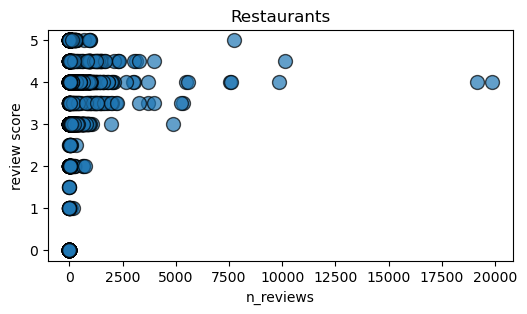

In [36]:
# Distribution of reviews as a function of number of reviews
# for the restaurants
fig, ax = plt.subplots(figsize = (6, 3))
ax.scatter(restaurants_df["review_count_R"], restaurants_df["score_R"], 
           s=100, alpha=0.7, edgecolors="k")
#ax.set_xscale("log")
ax.set_title("Restaurants")
ax.set_xlabel("n_reviews")
ax.set_ylabel("review score")

In [37]:
# Calculating Bayesian Average for restaurants
#m = np.mean(restaurants_df.score_R[restaurants_df["score_R"] > 0])
#C = 100
#restaurants_df["Bayesian_avg_R"] = ((restaurants_df.score_R * restaurants_df.review_count_R) 
#                                  + (C * m)) / (C + restaurants_df.review_count_R)

S = np.mean(restaurants_df.score_R[restaurants_df["score_R"] > 0])
m_avg = np.mean(restaurants_df.review_count_R[restaurants_df["score_R"] > 0])

restaurants_df["Bayesian_avg_R"] = (restaurants_df.review_count_R/(restaurants_df.review_count_R + m_avg)) * restaurants_df.score_R +\
                                (m_avg/(restaurants_df.review_count_R + m_avg)) * S

restaurants_df = restaurants_df[(restaurants_df.score_R > 0) & (restaurants_df.review_count_R > 0)]
print("Number of restaurants: ", len(restaurants_df))
restaurants_df.head(3)

Number of restaurants:  2103


,gcode_A,dcode_A,name_R,score_R,review_count_R,x_R,y_R,istat_pro_com_R,municipality_R,Bayesian_avg_R
0,g187785,d3675611,' Na Tarantella,4.0,124,14.227416,40.849346,63049,Napoli,3.875594
1,g187785,d13986019,10 Diego Vitagliano Pizzeria,4.0,905,14.175711,40.817090,63049,Napoli,3.957589
2,g187785,d7736389,1947 pizza fritta,4.5,942,14.263642,40.849487,63049,Napoli,4.344316


In [38]:
# Getting the nearest node ids to each restaurant

id_nearest_node_R, dist_R = ox.distance.nearest_nodes(G, restaurants_df['x_R'], 
                                              restaurants_df['y_R'], 
                                              return_dist=True)

print("Successful mapping: ", len(restaurants_df) == len(id_nearest_node_R))


restaurants_df.insert(7, "id_nearest_node_R", id_nearest_node_R)
restaurants_df.insert(8, "x_nearest_node_R", 
                 np.float64(nodes.x[id_nearest_node_R]))
restaurants_df.insert(9, "y_nearest_node_R", 
                 np.float64(nodes.y[id_nearest_node_R]))

restaurants_df

Successful mapping:  True


,gcode_A,dcode_A,name_R,score_R,review_count_R,x_R,y_R,id_nearest_node_R,x_nearest_node_R,y_nearest_node_R,istat_pro_com_R,municipality_R,Bayesian_avg_R
0,g187785,d3675611,' Na Tarantella,4.0,124,14.227416,40.849346,4257788865,14.227476,40.849287,63049,Napoli,3.875594
1,g187785,d13986019,10 Diego Vitagliano Pizzeria,4.0,905,14.175711,40.817090,301471023,14.175882,40.816990,63049,Napoli,3.957589
2,g187785,d7736389,1947 pizza fritta,4.5,942,14.263642,40.849487,2907865598,14.263541,40.849607,63049,Napoli,4.344316
3,g187785,d2299303,21 Biergrube Ex KrÃ¼gel Vomero,3.5,1232,14.214264,40.838330,2889232882,14.214233,40.838077,63049,Napoli,3.559346
4,g187785,d10351179,CAFFETTERIA LA VELA SAS DI VELA CIRO EC,5.0,20,14.301530,40.843690,4961238753,14.301407,40.843796,63049,Napoli,3.899136
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299,g187785,d5888637,DOLCEZZE SICILIANE,4.0,51,14.258629,40.842545,9056904237,14.258551,40.842554,63049,Napoli,3.848155
2300,g187785,d20307953,PIANO B CHIAIA,4.0,11,14.234925,40.835964,3622284191,14.234671,40.835908,63049,Napoli,3.827281
2301,g187785,d4816545,VILLA CILENTO,4.0,49,14.197064,40.806038,7787468228,14.196763,40.806928,63049,Napoli,3.847232
2302,g187785,d17599430,LOVEFOR NUâ€™ CAFÃˆ,2.0,20,14.244353,40.835957,3455678355,14.244763,40.835817,63049,Napoli,3.699116


(Mean, Std):  25.4 25.6


<Axes: >

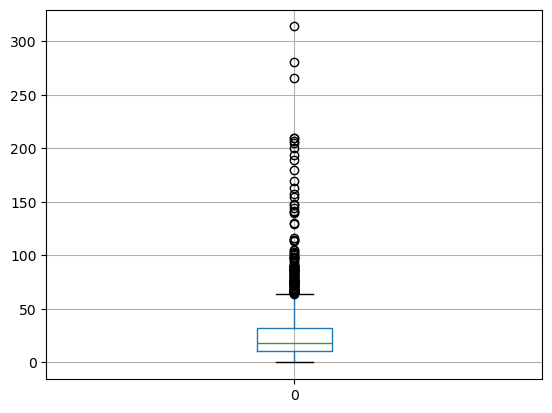

In [40]:
# Distribution of distance
print("(Mean, Std): ", np.around(np.mean(dist_R), decimals=1), np.around(np.std(dist_R), decimals=1))
pd.DataFrame(dist_R).boxplot()

In [37]:
# Filtering top-k restaurants based on Bayesian avg.
k =  len(restaurants_df[restaurants_df.Bayesian_avg_R >= 4]) #700 #  len(restaurants_df)
top_k_R_df = restaurants_df.sort_values('Bayesian_avg_R', ascending = False)[0:k]
top_k_R_df.reset_index(drop = True)
top_k_R_df[["name_R", "score_R", "review_count_R", "Bayesian_avg_R"]].head(10)
#restaurants_df[restaurants_df.Bayesian_avg_R >= restaurants_df['Bayesian_avg_R'].quantile(0.75)].sort_values('Bayesian_avg_R', ascending = False)[0:]

,name_R,score_R,review_count_R,Bayesian_avg_R
434,Hachi Ristorante Giapponese,5.0,7757,4.958912
504,Januarius,5.0,986,4.739152
1566,RE PAZZO - PIZZA & SFIZI,5.0,967,4.735178
1917,PIZZERIA SPERANZELLA,5.0,932,4.727530
1311,PIZZERIA CICCIO FRI,5.0,681,4.656362
1307,OPERA RESTAURANT,5.0,384,4.502650
943,Pizzeria Starita a Materdei,4.5,10111,4.481692
779,Osteria Il Gobbetto,4.5,3982,4.455363
1126,Tandem,4.5,3270,4.446411
95,Antica Capri,4.5,3118,4.444013


In [38]:
len(top_k_R_df)

111

#### Defining metro stations (destination nodes)

In [39]:
# Retrieving METRO (tram variable name is kept from previous city) stations nodes
tram_df = ox.features.features_from_place(place, {'railway': 'station', 'subway': 'yes'}, which_result=None, buffer_dist=None)
tram_df = tram_df.drop_duplicates(subset=['name'], keep='first')
tram_df["x_M"] = tram_df.geometry.get_coordinates()["x"]
tram_df["y_M"] = tram_df.geometry.get_coordinates()["y"]
tram_df.drop(["wheelchair", "operator", "wikidata", "wikipedia", "geometry", "network", "public_transport"
              , "train", "level", "light_rail", "note", "railway", "start_date", 
             "funicular", "short_name", "platforms", "wikimedia_commons", "source", "layer", 
             "construction:public_transport", "website", "nodes", "construction:railway", "building", 
             "area", "ref", "tunnel", "barrier", "station", "subway"], axis = 1, inplace = True)
#tram_df.drop(["bench", "bin", "internet_access", "internet_access:fee", "internet_access:operator", 
#             "lit", "public_transport", "railway", "shelter", "tactile_paving", "tram", 
#             "wheelchair", "geometry"], axis = 1, inplace = True)

tram_df.rename(columns={"name": "name_M"}, inplace = True)

In [40]:
# Source: https://www.metropolitanadinapoli.it/linea-6-metropolitana-di-napoli/
Napoli_stations = [
    "Piscinola-Scampia",
    "Chiaiano",
    "Frullone",
    "Colli Aminei",
    "Policlinico",
    "Rione Alto",
    "Montedonzelli",
    "Medaglie d'Oro",
    "Vanvitelli",
    "Quattro Giornate",
    "Salvator Rosa",
    "Materdei",
    "Museo",
    "Dante",
    "Toledo",
    "Municipio",
    "Università",
    "Garibaldi",
    "Mergellina",
    "Lala",
    "Augusto",
    "Mostra", 
    "Duomo"
]

tram_df = tram_df[tram_df['name_M'].isin(Napoli_stations)]

In [41]:
# Reset index
tram_df.reset_index(drop=True, inplace = True)

# Checking if the stations are inside the city
tram_df['in_bbox'] = tram_df.apply(lambda x: city_polygon.contains(Point(x.x_M, x.y_M)), axis=1)
tram_df = tram_df.loc[tram_df.in_bbox == True].reset_index(drop=True)
tram_df.drop("in_bbox", axis=1, inplace=True)

print("Number of Metro/Tram Stations/Stops: ", len(tram_df))
tram_df

Number of Metro/Tram Stations/Stops:  23


,name_M,x_M,y_M
0,Chiaiano,14.223476,40.890712
1,Vanvitelli,14.231745,40.843919
2,Quattro Giornate,14.225124,40.846337
3,Materdei,14.242313,40.855058
4,Museo,14.251697,40.853424
5,Dante,14.250120,40.848942
6,Montedonzelli,14.225026,40.855950
7,Piscinola-Scampia,14.239836,40.892940
8,Lala,14.204566,40.826819
9,Mergellina,14.217367,40.830597


In [42]:
tram_df["name_M"]

0              Chiaiano
1            Vanvitelli
2      Quattro Giornate
3              Materdei
4                 Museo
5                 Dante
6         Montedonzelli
7     Piscinola-Scampia
8                  Lala
9            Mergellina
10              Augusto
11           Università
12             Frullone
13               Toledo
14                Duomo
15          Policlinico
16         Colli Aminei
17           Rione Alto
18       Medaglie d'Oro
19            Garibaldi
20               Mostra
21        Salvator Rosa
22            Municipio
Name: name_M, dtype: object

In [43]:
# Getting the nearest node ids to each tram station

id_nearest_node_M, dist_M = ox.distance.nearest_nodes(G, tram_df['x_M'], 
                                              tram_df['y_M'], 
                                              return_dist=True)

print("Successful mapping: ", len(tram_df) == len(id_nearest_node_M))


tram_df.insert(len(tram_df.columns), "id_nearest_node_M", id_nearest_node_M)
tram_df.insert(len(tram_df.columns), "x_nearest_node_M", 
                 np.float64(nodes.x[id_nearest_node_M]))
tram_df.insert(len(tram_df.columns), "y_nearest_node_M", 
                 np.float64(nodes.y[id_nearest_node_M]))

tram_df

Successful mapping:  True


C:\Users\mario\anaconda3\Lib\site-packages\pandas\core\algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
C:\Users\mario\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\mario\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


,name_M,x_M,y_M,id_nearest_node_M,x_nearest_node_M,y_nearest_node_M
0,Chiaiano,14.223476,40.890712,11494391846,14.223367,40.890672
1,Vanvitelli,14.231745,40.843919,324621070,14.231734,40.844054
2,Quattro Giornate,14.225124,40.846337,11495534852,14.224993,40.846190
3,Materdei,14.242313,40.855058,4155755042,14.242351,40.855250
4,Museo,14.251697,40.853424,4320624023,14.251731,40.853433
5,Dante,14.250120,40.848942,11495610008,14.249948,40.848957
6,Montedonzelli,14.225026,40.855950,434504493,14.224702,40.855853
7,Piscinola-Scampia,14.239836,40.892940,8857482820,14.239968,40.892926
8,Lala,14.204566,40.826819,2340730460,14.204831,40.826949
9,Mergellina,14.217367,40.830597,3635585506,14.218056,40.830494


#### Defining walking speed

In [44]:
# Defining walking speed
speed_ms = 1 # In m/s
speed_mm = speed_ms * 60 # In m/min

#### Creating the combination of each Hotel to each Attraction to calculate Shortest Paths

In [45]:
# Creating keys for cross join
hotels_df['_key'] = 1 
top_k_A_df['_key'] = 1

# Performing the cross join to obtain Hotels-Attractions Data Frame
H_A_df = pd.merge(hotels_df, top_k_A_df, on='_key').drop('_key', axis=1)
hotels_df = hotels_df.drop("_key", axis=1)
top_k_A_df = top_k_A_df.drop("_key", axis=1)

# Calculating shortest paths in meters and minutes
H_A_df["SP_dist_meters"] = G_pdna.shortest_path_lengths(H_A_df["id_nearest_node_H"], H_A_df["id_nearest_node_A"], 
                      imp_name="length")

H_A_df["SP_dist_minutes"] = H_A_df["SP_dist_meters"] / speed_mm

# Calculating Great Circle distance in meters
H_A_df["GC_dist_meters"] = ox.distance.great_circle(H_A_df.x_nearest_node_H, H_A_df.y_nearest_node_H, 
                                                    H_A_df.x_nearest_node_A, H_A_df.y_nearest_node_A)

# Rearranging DataFrame
H_A_df.insert(0, "name_H", H_A_df.pop("name_H"))
H_A_df.insert(1, "name_A", H_A_df.pop("name_A"))
H_A_df.insert(2, "SP_dist_minutes", H_A_df.pop("SP_dist_minutes"))

In [46]:
H_A_df.sort_values("SP_dist_minutes", ascending = False).head(10)

,name_H,name_A,SP_dist_minutes,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,...,x_A,y_A,id_nearest_node_A,x_nearest_node_A,y_nearest_node_A,istat_pro_com_A,municipality_A,Bayesian_avg_A,SP_dist_meters,GC_dist_meters
1326134,2457,Parco dei Murales,337.751133,603357788505258621,a few days or more,0.0,0.67,f,Pianura,40.873360,...,14.340444,40.858419,9392736650,14.339749,40.858474,63049,Napoli,4.072744,20265.068,18615.731060
284168,526,Parco dei Murales,337.751133,26247698,NaN,NaN,0.67,f,Pianura,40.873930,...,14.340444,40.858419,9392736650,14.339749,40.858474,63049,Napoli,4.072744,20265.068,18615.731060
284194,526,Basilica Santa Maria della Neve,324.404033,26247698,NaN,NaN,0.67,f,Pianura,40.873930,...,14.331956,40.854630,1332450522,14.331757,40.854456,63049,Napoli,4.062296,19464.242,17774.556351
1326160,2457,Basilica Santa Maria della Neve,324.404033,603357788505258621,a few days or more,0.0,0.67,f,Pianura,40.873360,...,14.331956,40.854630,1332450522,14.331757,40.854456,63049,Napoli,4.062296,19464.242,17774.556351
1326466,2457,Centro Commerciale Auchan,318.068350,603357788505258621,a few days or more,0.0,0.67,f,Pianura,40.873360,...,14.328618,40.858337,4948921617,14.328777,40.858418,63049,Napoli,4.035211,19084.101,17401.108308
284500,526,Centro Commerciale Auchan,318.068350,26247698,NaN,NaN,0.67,f,Pianura,40.873930,...,14.328618,40.858337,4948921617,14.328777,40.858418,63049,Napoli,4.035211,19084.101,17401.108308
1405090,2603,Parco Letterario di Nisida,311.251267,1041229696592994886,within an hour,1.0,1.00,f,Ponticelli,40.867579,...,14.166478,40.796349,1446117593,14.166166,40.796723,63049,Napoli,4.086147,18675.076,20040.300350
642821,1191,Parco Letterario di Nisida,308.516500,954822537793265927,NaN,NaN,1.00,f,Ponticelli,40.869291,...,14.166478,40.796349,1446117593,14.166166,40.796723,63049,Napoli,4.086147,18510.990,19927.166007
284201,526,Tennis Atheneo,307.716533,26247698,NaN,NaN,0.67,f,Pianura,40.873930,...,14.305881,40.882624,1782450294,14.306874,40.881759,63049,Napoli,4.060062,18462.992,14920.604058
1326167,2457,Tennis Atheneo,307.716533,603357788505258621,a few days or more,0.0,0.67,f,Pianura,40.873360,...,14.305881,40.882624,1782450294,14.306874,40.881759,63049,Napoli,4.060062,18462.992,14920.604058


#### Creating the combination of each Hotel to each Restaurant to calculate Shortest Paths

In [47]:
# Creating keys for cross join
hotels_df['_key'] = 1 
top_k_R_df['_key'] = 1

# Performing the cross join to obtain Hotels-Restaurants Data Frame
H_R_df = pd.merge(hotels_df, top_k_R_df, on='_key').drop('_key', axis=1)
hotels_df = hotels_df.drop("_key", axis=1)
top_k_R_df = top_k_R_df.drop("_key", axis=1)

# Calculating shortest paths in meters and minutes
H_R_df["SP_dist_meters"] = G_pdna.shortest_path_lengths(H_R_df["id_nearest_node_H"], H_R_df["id_nearest_node_R"], 
                      imp_name="length")

H_R_df["SP_dist_minutes"] = H_R_df["SP_dist_meters"] / speed_mm

# Calculating Great Circle distance in meters
H_R_df["GC_dist_meters"] = ox.distance.great_circle(H_R_df.x_nearest_node_H, H_R_df.y_nearest_node_H, 
                                                    H_R_df.x_nearest_node_R, H_R_df.y_nearest_node_R)

# Rearranging DataFrame
H_R_df.insert(0, "name_H", H_R_df.pop("name_H"))
H_R_df.insert(1, "name_R", H_R_df.pop("name_R"))
H_R_df.insert(2, "SP_dist_minutes", H_R_df.pop("SP_dist_minutes"))

In [48]:
H_R_df.sort_values("SP_dist_minutes", ascending = False).head(3)

,name_H,name_R,SP_dist_minutes,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,...,x_R,y_R,id_nearest_node_R,x_nearest_node_R,y_nearest_node_R,istat_pro_com_R,municipality_R,Bayesian_avg_R,SP_dist_meters,GC_dist_meters
288355,2603,RISTO-PESCHERIA DA SALVATORE,290.028517,1041229696592994886,within an hour,1.0,1.0,f,Ponticelli,40.867579,...,14.168944,40.856323,926204496,14.168874,40.856176,63049,Napoli,4.097669,17401.711,18258.735259
260050,2346,RISTO-PESCHERIA DA SALVATORE,289.843000,26965456,NaN,NaN,NaN,f,Ponticelli,40.863150,...,14.168944,40.856323,926204496,14.168874,40.856176,63049,Napoli,4.097669,17390.580,19067.034446
293350,2648,RISTO-PESCHERIA DA SALVATORE,289.666733,28250182,NaN,NaN,NaN,f,Ponticelli,40.864550,...,14.168944,40.856323,926204496,14.168874,40.856176,63049,Napoli,4.097669,17380.004,19001.659573


#### Creating the combination of each Hotel to each Metro/Tram Station/Stop to calculate Shortest Paths

In [49]:
# Creating keys for cross join
hotels_df['_key'] = 1 
tram_df['_key'] = 1

# Performing the cross join to obtain Hotels-Tram Stops Data Frame
H_M_df = pd.merge(hotels_df, tram_df, on='_key').drop('_key', axis=1)
hotels_df = hotels_df.drop("_key", axis=1)
tram_df = tram_df.drop("_key", axis=1)

# Calculating shortest paths in meters and minutes
H_M_df["SP_dist_meters"] = G_pdna.shortest_path_lengths(H_M_df["id_nearest_node_H"], H_M_df["id_nearest_node_M"], 
                      imp_name="length")

H_M_df["SP_dist_minutes"] = H_M_df["SP_dist_meters"] / speed_mm

# Calculating Great Circle distance in meters
H_M_df["GC_dist_meters"] = ox.distance.great_circle(H_M_df.x_nearest_node_H, H_M_df.y_nearest_node_H, 
                                                    H_M_df.x_nearest_node_M, H_M_df.y_nearest_node_M)

# Rearranging DataFrame
H_M_df.insert(0, "name_H", H_M_df.pop("name_H"))
H_M_df.insert(1, "name_M", H_M_df.pop("name_M"))
H_M_df.insert(2, "SP_dist_minutes", H_M_df.pop("SP_dist_minutes"))

In [50]:
# Keeping the closest tram stop, and adding a binary variable
H_M_df = H_M_df.sort_values("SP_dist_minutes", ascending = True).drop_duplicates(['name_H'])
H_M_df["Metro_Tram_stop"] = [1 if x <= X_minutes else 0 for x in H_M_df['SP_dist_minutes']]
H_M_df.reset_index(drop=True, inplace=True)
H_M_df

,name_H,name_M,SP_dist_minutes,id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,neighbourhood_cleansed,y_H,...,Miscellaneous,Bayesian_avg_H,x_M,y_M,id_nearest_node_M,x_nearest_node_M,y_nearest_node_M,SP_dist_meters,GC_dist_meters,Metro_Tram_stop
0,426,Università,0.000000,40459514,within an hour,1.0,1.00,f,Porto,40.843520,...,0,4.523303,14.255516,40.843594,4940774333,14.255368,40.843525,0.000,0.000000,1
1,5393,Duomo,0.000000,763034599883505566,within an hour,1.0,0.99,f,Pendino,40.847580,...,0,4.799249,14.261608,40.847617,8667108987,14.261791,40.847509,0.000,0.000000,1
2,766,Duomo,0.000000,777512425583201706,within an hour,1.0,1.00,t,Pendino,40.847619,...,0,4.755192,14.261608,40.847617,8667108987,14.261791,40.847509,0.000,0.000000,1
3,4074,Toledo,0.000000,746429457589180258,within an hour,1.0,1.00,t,Montecalvario,40.842469,...,0,4.840065,14.248874,40.842437,5292237490,14.248862,40.842427,0.000,0.000000,1
4,3699,Salvator Rosa,0.000000,41528273,within an hour,1.0,1.00,t,Avvocata,40.852000,...,0,4.776229,14.236764,40.851551,10853438042,14.236767,40.851526,0.000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7015,2648,Garibaldi,111.470750,28250182,NaN,NaN,NaN,f,Ponticelli,40.864550,...,0,4.738345,14.270042,40.851892,9070364950,14.270080,40.851712,6688.245,7847.963524,0
7016,1191,Garibaldi,112.400817,954822537793265927,NaN,NaN,1.00,f,Ponticelli,40.869291,...,0,4.724110,14.270042,40.851892,9070364950,14.270080,40.851712,6744.049,7034.978194,0
7017,2603,Garibaldi,115.135583,1041229696592994886,within an hour,1.0,1.00,f,Ponticelli,40.867579,...,0,4.718686,14.270042,40.851892,9070364950,14.270080,40.851712,6908.135,7175.455281,0
7018,2457,Mostra,127.693383,603357788505258621,a few days or more,0.0,0.67,f,Pianura,40.873360,...,0,4.757421,14.193656,40.824337,6844222496,14.193325,40.824352,7661.603,5735.741777,0


In [51]:
#nx.shortest_path_length(G, 343709332, 332103291, weight = "length") / speed_mm

In [52]:
# Metrics at X minutes distance for attractions

# X minutes level 1
A_lvl1 = pd.DataFrame(H_A_df.name_H[H_A_df["SP_dist_minutes"] <= X_minutes].value_counts())

hotel_name_list_lvl1 = []
hotel_n_reviews_list_lvl1 = []
Bayes_avg_list_H_lvl1 = []

for i in range(0, len(A_lvl1)):
    hotel_name_list_lvl1.append(hotels_df.amenities_count.loc[hotels_df["name_H"] == A_lvl1.index[i]])
    hotel_n_reviews_list_lvl1.append(hotels_df.review_count_H.loc[hotels_df["name_H"] == A_lvl1.index[i]])
    Bayes_avg_list_H_lvl1.append(hotels_df.Bayesian_avg_H.loc[hotels_df["name_H"] == A_lvl1.index[i]])

    
A_lvl1.insert(1, "amenities_count", np.float64(hotel_name_list_lvl1))
A_lvl1.insert(1, "review_count_H", np.float64(hotel_n_reviews_list_lvl1))
A_lvl1.insert(1, "Bayes_avg_H", np.float64(Bayes_avg_list_H_lvl1))
A_lvl1

,count,Bayes_avg_H,review_count_H,amenities_count
name_H,,,,
1936,183,4.833596,108.0,35.0
3255,183,4.743390,2.0,20.0
1269,183,4.761763,6.0,35.0
5056,183,4.671471,9.0,22.0
2643,183,4.666373,20.0,21.0
...,...,...,...,...
3488,1,4.787973,18.0,39.0
3492,1,4.738345,1.0,30.0
3501,1,4.691498,3.0,33.0


In [53]:
# Metrics at X minutes distance for restaurants

# X minutes level 1
R_lvl1 = pd.DataFrame(H_R_df.name_H[H_R_df["SP_dist_minutes"] <= X_minutes].value_counts())

hotel_name_list_lvl1 = []
hotel_n_reviews_list_lvl1 = []
Bayes_avg_list_H_lvl1 = []

for i in range(0, len(R_lvl1)):
    hotel_name_list_lvl1.append(hotels_df.amenities_count.loc[hotels_df["name_H"] == R_lvl1.index[i]])
    hotel_n_reviews_list_lvl1.append(hotels_df.review_count_H.loc[hotels_df["name_H"] == R_lvl1.index[i]])
    Bayes_avg_list_H_lvl1.append(hotels_df.Bayesian_avg_H.loc[hotels_df["name_H"] == R_lvl1.index[i]])

    
R_lvl1.insert(1, "amenities_count", np.float64(hotel_name_list_lvl1))
R_lvl1.insert(1, "review_count_H", np.float64(hotel_n_reviews_list_lvl1))
R_lvl1.insert(1, "Bayes_avg_H", np.float64(Bayes_avg_list_H_lvl1))
R_lvl1

,count,Bayes_avg_H,review_count_H,amenities_count
name_H,,,,
1582,41,4.738345,1.0,24.0
843,41,4.627331,92.0,25.0
6116,41,4.738345,1.0,27.0
4833,41,4.738345,1.0,20.0
1469,40,4.783357,16.0,46.0
...,...,...,...,...
1815,1,4.672624,6.0,14.0
1816,1,4.770446,17.0,30.0
1817,1,4.708064,6.0,29.0


# FOR JUPYTER LAB

test_map = keplergl.KeplerGl()

df = hotels_df[["name_H", "x_H", "y_H"]].copy()
df.rename(columns={"name_H": "Hotel name", "x_H": "Longitude", "y_H":"Latitude"}, inplace = True)
df_Count = []
for name in list(df["Hotel name"]):
    if name in A_lvl1.index:
        df_Count.append(A_lvl1.values[A_lvl1.index==name][0][0])
    else:
        df_Count.append(0)
df.insert(len(df.columns), "Count", df_Count)
test_map.add_data(data=df)

#test_map.add_data(data=counts_H)


orig_html = str(test_map._repr_html_(),'utf-8')

better_html = orig_html
b64 = base64.b64encode(better_html.encode('utf-8'))
src = f"data:text/html;base64,{b64.decode('utf-8')}"
base64d_html = f'<iframe src="{src}" style="width:100%; height: 400px">'
IPython.display.HTML(base64d_html)

In [54]:
# KeplerGL config

kepler_config = {'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': '2fxa7ht',
     'type': 'point',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels',
      'color': [184, 110, 218],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 4,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': [240, 237, 234],
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000',
         '#FF3300',
         '#FF6600',
         '#FF9900',
         '#FFCC00',
         '#CCFF00',
         '#99FF00',
         '#66FF00',
         '#33FF00',
         '#00FF00']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [184, 110, 218],
        'size': 11,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': None,
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'csiktu',
     'type': 'point',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_points_TWI',
      'color': [231, 159, 213],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 8,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': [240, 237, 234],
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#a50026',
         '#d73027',
         '#f46d43',
         '#fdae61',
         '#fee08b',
         '#d9ef8b',
         '#a6d96a',
         '#66bd63',
         '#1a9850',
         '#006837']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [173, 185, 51],
        'size': 8,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'TWI', 'type': 'real'},
      'colorScale': 'quantize',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'ifo3kcp',
     'type': 'point',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_points_Walkability_num',
      'color': [231, 159, 213],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 8,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': [240, 237, 234],
       'colorRange': {'name': 'ColorBrewer RdYlGn-5',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#d7191c', '#fdae61', '#ffffbf', '#a6d96a', '#1a9641']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [173, 185, 51],
        'size': 8,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Walkability_num',
       'type': 'integer'},
      'colorScale': 'quantize',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': '3tag46c',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_A_count',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000',
         '#FF3300',
         '#FF6600',
         '#FF9900',
         '#FFCC00',
         '#CCFF00',
         '#99FF00',
         '#66FF00',
         '#33FF00',
         '#00FF00']},
       'coverage': 1,
       'sizeRange': [0, 500],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 1,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'sum',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Count_A', 'type': 'integer'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Count_A', 'type': 'integer'},
      'sizeScale': 'linear'}},
    {'id': 'aw0qhcc',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_R_count',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000',
         '#FF3300',
         '#FF6600',
         '#FF9900',
         '#FFCC00',
         '#CCFF00',
         '#99FF00',
         '#66FF00',
         '#33FF00',
         '#00FF00']},
       'coverage': 1,
       'sizeRange': [0, 500],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 1,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'sum',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Count_R', 'type': 'integer'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Count_R', 'type': 'integer'},
      'sizeScale': 'linear'}},
    {'id': 'pmgr4v',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_M_binary',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000',
         '#FF3300',
         '#FF6600',
         '#FF9900',
         '#FFCC00',
         '#CCFF00',
         '#99FF00',
         '#66FF00',
         '#33FF00',
         '#00FF00']},
       'coverage': 1,
       'sizeRange': [0, 500],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 1,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'sum',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Metro_Tram_stop',
       'type': 'integer'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Metro_Tram_stop', 'type': 'integer'},
      'sizeScale': 'linear'}},
    {'id': '76hrvw',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_A_Closeness',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000', '#FF6600', '#FFCC00', '#99FF00', '#00FF00']},
       'coverage': 1,
       'sizeRange': [0, 500],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 1,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'sum',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Closeness_Centrality_Attractions',
       'type': 'real'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Closeness_Centrality_Attractions',
       'type': 'real'},
      'sizeScale': 'linear'}},
    {'id': 'aqi7i2u',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_R_Closeness',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000', '#FF6600', '#FFCC00', '#99FF00', '#00FF00']},
       'coverage': 1,
       'sizeRange': [0, 500],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 1,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'sum',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Closeness_Centrality_Restaurants',
       'type': 'real'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Closeness_Centrality_Restaurants',
       'type': 'real'},
      'sizeScale': 'linear'}},
    {'id': 'qy3pmbe',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_class',
      'color': [246, 209, 138],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000', '#FF6600', '#FFCC00', '#CCFF00', '#00FF00']},
       'coverage': 1,
       'sizeRange': [200, 600],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 1,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'average',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': None,
      'colorScale': 'quantize',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'd9bu4gf',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_score',
      'color': [30, 150, 190],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'ColorBrewer RdYlGn-5',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#d7191c', '#fdae61', '#ffffbf', '#a6d96a', '#1a9641']},
       'coverage': 1,
       'sizeRange': [20, 300],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 5,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'average',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Score_H', 'type': 'real'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Score_H', 'type': 'real'},
      'sizeScale': 'linear'}},
    {'id': '6r22q1w',
     'type': 'grid',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_review_count',
      'color': [30, 150, 190],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 1,
       'worldUnitSize': 0.025,
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#a50026',
         '#d73027',
         '#f46d43',
         '#fdae61',
         '#fee08b',
         '#d9ef8b',
         '#a6d96a',
         '#66bd63',
         '#1a9850',
         '#006837']},
       'coverage': 1,
       'sizeRange': [20, 300],
       'percentile': [0, 100],
       'elevationPercentile': [0, 100],
       'elevationScale': 5,
       'enableElevationZoomFactor': True,
       'colorAggregation': 'average',
       'sizeAggregation': 'average',
       'enable3d': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Review_count_H',
       'type': 'integer'},
      'colorScale': 'quantize',
      'sizeField': {'name': 'Review_count_H', 'type': 'integer'},
      'sizeScale': 'linear'}},
    {'id': '2sol0j',
     'type': 'point',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_3D_Bayes_Avg',
      'color': [30, 150, 190],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': True,
      'visConfig': {'radius': 10,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'ColorBrewer RdYlGn-5',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#d7191c', '#fdae61', '#ffffbf', '#a6d96a', '#1a9641']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 8],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Bayesian_avg_H',
       'type': 'real'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': '6g29u9r',
     'type': 'heatmap',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels_heat_map',
      'color': [218, 112, 191],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude'},
      'isVisible': False,
      'visConfig': {'opacity': 0.8,
       'colorRange': {'name': 'ColorBrewer RdYlGn-10',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#a50026',
         '#d73027',
         '#f46d43',
         '#fdae61',
         '#fee08b',
         '#d9ef8b',
         '#a6d96a',
         '#66bd63',
         '#1a9850',
         '#006837']},
       'radius': 100},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'weightField': None, 'weightScale': 'linear'}},
    {'id': '2jqr7zb',
     'type': 'point',
     'config': {'dataId': 'Attractions',
      'label': 'Attractions',
      'color': [36, 115, 189],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10.4,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': [72, 43, 189],
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [66, 101, 204],
        'size': 10,
        'offset': [0, 0],
        'anchor': 'middle',
        'alignment': 'bottom'}]},
     'visualChannels': {'colorField': None,
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'se4ty0m',
     'type': 'point',
     'config': {'dataId': 'Restaurants',
      'label': 'Restaurants',
      'color': [218, 0, 0],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10.4,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': [30, 150, 190],
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [240, 237, 234],
        'size': 8,
        'offset': [0, 0],
        'anchor': 'middle',
        'alignment': 'bottom'}]},
     'visualChannels': {'colorField': None,
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'o69bpud',
     'type': 'point',
     'config': {'dataId': 'Metro/Tram',
      'label': 'Metro/Tram Stops',
      'color': [214, 160, 0],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10.4,
       'fixedRadius': False,
       'opacity': 0.8,
       'outline': False,
       'thickness': 2,
       'strokeColor': [30, 150, 190],
       'colorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': {'name': 'Tram Stop name', 'type': 'string'},
        'color': [185, 118, 0],
        'size': 10,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': None,
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'pj7phwm',
     'type': 'point',
     'config': {'dataId': 'unnamed',
      'label': 'price',
      'color': [34, 63, 154],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 4,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#00FF00', '#CCFF00', '#FFCC00', '#FF6600', '#FF0000'],
        'reversed': True},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'price', 'type': 'integer'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': 'mxggy1p',
     'type': 'point',
     'config': {'dataId': 'Attractions',
      'label': 'Bayes Attractions',
      'color': [218, 112, 191],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 10.4,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'ColorBrewer RdYlGn-5',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#d7191c', '#fdae61', '#ffffbf', '#a6d96a', '#1a9641']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Bayesian_avg_A',
       'type': 'real'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}},
    {'id': '79yotqi',
     'type': 'point',
     'config': {'dataId': 'Restaurants',
      'label': 'Bayes Restaurants',
      'color': [218, 112, 191],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude',
       'lng': 'Longitude',
       'altitude': 'Bayesian_avg_R'},
      'isVisible': False,
      'visConfig': {'radius': 10.4,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': None,
       'colorRange': {'name': 'ColorBrewer RdYlGn-5',
        'type': 'diverging',
        'category': 'ColorBrewer',
        'colors': ['#d7191c', '#fdae61', '#ffffbf', '#a6d96a', '#1a9641']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',
         '#C70039',
         '#E3611C',
         '#F1920E',
         '#FFC300']},
       'radiusRange': [0, 50],
       'filled': True},
      'hidden': False,
      'textLabel': [{'field': None,
        'color': [255, 255, 255],
        'size': 18,
        'offset': [0, 0],
        'anchor': 'start',
        'alignment': 'center'}]},
     'visualChannels': {'colorField': {'name': 'Bayesian_avg_R',
       'type': 'real'},
      'colorScale': 'quantile',
      'strokeColorField': None,
      'strokeColorScale': 'quantile',
      'sizeField': None,
      'sizeScale': 'linear'}}],
   'interactionConfig': {'tooltip': {'fieldsToShow': {'unnamed': [{'name': 'Hotel name',
        'format': None},
       {'name': 'Longitude', 'format': None},
       {'name': 'Latitude', 'format': None},
       {'name': 'Walkability_num', 'format': None}],
      'Attractions': [{'name': 'Attraction name', 'format': None},
       {'name': 'Longitude', 'format': None},
       {'name': 'Latitude', 'format': None}],
      'Restaurants': [{'name': 'Restaurant name', 'format': None},
       {'name': 'Longitude', 'format': None},
       {'name': 'Latitude', 'format': None}],
      'Metro/Tram': [{'name': 'Tram Stop name', 'format': None},
       {'name': 'Longitude', 'format': None},
       {'name': 'Latitude', 'format': None}]},
     'compareMode': False,
     'compareType': 'absolute',
     'enabled': True},
    'brush': {'size': 0, 'enabled': False},
    'geocoder': {'enabled': False},
    'coordinate': {'enabled': False}},
   'layerBlending': 'normal',
   'splitMaps': [],
   'animationConfig': {'currentTime': None, 'speed': 1}},
  'mapState': {'bearing': 0,
   'dragRotate': False,
   'latitude': 40.844044666751145,
   'longitude': 14.255318488795316,
   'pitch': 0,
   'zoom': 11.36331618573136,
   'isSplit': False},
  'mapStyle': {'styleType': 'a0lwzne',
   'topLayerGroups': {},
   'visibleLayerGroups': {'label': False,
    'road': True,
    'building': True,
    'water': True,
    'land': True},
   'threeDBuildingColor': [9.665468314072013,
    17.18305478057247,
    31.1442867897876],
   'mapStyles': {'a0lwzne': {'accessToken': None,
     'custom': True,
     'icon': 'https://api.mapbox.com/styles/v1/mapbox/streets-v12/static/-122.3391,37.7922,9,0,0/400x300?access_token=pk.eyJ1IjoidWNmLW1hcGJveCIsImEiOiJja3RpeXhkaXcxNzJtMnZxbmtkcnJuM3BkIn0.kGmGlkbuWaCBf7_RrZXULg&logo=false&attribution=false',
     'id': 'a0lwzne',
     'label': 'Mapbox Streets',
     'url': 'mapbox://styles/mapbox/streets-v12'}}}}}

In [55]:
hotels_df.columns

Index(['id', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'neighbourhood_cleansed',
       'y_H', 'id_nearest_node_H', 'x_nearest_node_H', 'y_nearest_node_H',
       'x_H', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights',
       'maximum_nights', 'availability_365', 'review_count_H', 'score_H',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'amenities_count',
       'name_H', 'TVs', 'Wifi', 'Parking', 'Kitchen_Appliances',
       'Bathroom_Amenities', 'Child_Amenities', 'Entertainment_Systems',
       'Miscellaneous', 'Bayesian_avg_H'],
      dtype='object')

In [56]:
# Hotels
df = hotels_df[["name_H", "x_H", "y_H"]].copy()
df.rename(columns={"name_H": "Hotel name", "x_H": "Longitude", "y_H":"Latitude"}, inplace = True)
df_Count_A = []
df_Count_R = []
df_metro_tram_stop = []
df_CC_A = [] # Closeness centrality calculation to each Attraction node (every node)
df_CC_R = [] # Closeness centrality calculation to each Restaurant node (every node)
df_ST_A = [] # Directness calculation to each Attraction node (every node)
df_ST_R = [] # Directness calculation to each Restaurant node (every node)

for name in list(df["Hotel name"]):
    if name in A_lvl1.index:
        df_Count_A.append(A_lvl1.values[A_lvl1.index==name][0][0])
    else:
        df_Count_A.append(0)
    if name in R_lvl1.index:
        df_Count_R.append(R_lvl1.values[R_lvl1.index==name][0][0])
    else:
        df_Count_R.append(0)
    df_metro_tram_stop.append(H_M_df.Metro_Tram_stop[H_M_df.name_H == name].values[0])
    df_CC_A.append(len(top_k_A_df)/np.sum(H_A_df.SP_dist_meters[H_A_df.name_H == name]))
    df_CC_R.append(len(top_k_R_df)/np.sum(H_R_df.SP_dist_meters[H_R_df.name_H == name]))
    df_ST_A.append(len(top_k_A_df)/np.sum(H_A_df.SP_dist_meters[H_A_df.name_H == name]))
    
df.insert(len(df.columns), "Count_A", df_Count_A)
df.insert(len(df.columns), "Count_R", df_Count_R)
df.insert(len(df.columns), "Metro_Tram_stop", df_metro_tram_stop)
df.insert(len(df.columns), "Closeness_Centrality_Attractions", df_CC_A)
df.insert(len(df.columns), "Closeness_Centrality_Restaurants", df_CC_R)
df["amenities_count"] = hotels_df.amenities_count[hotels_df["name_H"] == df["Hotel name"]]
df["Review_count_H"] = hotels_df.review_count_H[hotels_df["name_H"] == df["Hotel name"]]
df["Score_H"] = hotels_df.score_H[hotels_df["name_H"] == df["Hotel name"]]
df["Bayesian_avg_H"] = hotels_df.Bayesian_avg_H[hotels_df["name_H"] == df["Hotel name"]]
df["price"] = hotels_df.price[hotels_df["name_H"] == df["Hotel name"]]
#df["avg_price_log"] = np.log(hotels_df.avg_price[hotels_df["name_H"] == df["Hotel name"]])
df["location_score"] = hotels_df.review_scores_location[hotels_df["name_H"] == df["Hotel name"]]
df["host_response_time"] = hotels_df.host_response_time[hotels_df["name_H"] == df["Hotel name"]]
df["host_response_rate"] = hotels_df.host_response_rate[hotels_df["name_H"] == df["Hotel name"]]
df["host_acceptance_rate"] = hotels_df.host_acceptance_rate[hotels_df["name_H"] == df["Hotel name"]]
df["host_is_superhost"] = hotels_df.host_is_superhost[hotels_df["name_H"] == df["Hotel name"]]
df["neighbourhood_cleansed"] = hotels_df.neighbourhood_cleansed[hotels_df["name_H"] == df["Hotel name"]]
df["property_type"] = hotels_df.property_type[hotels_df["name_H"] == df["Hotel name"]]
df["room_type"] = hotels_df.room_type[hotels_df["name_H"] == df["Hotel name"]]
df["accommodates"] = hotels_df.accommodates[hotels_df["name_H"] == df["Hotel name"]]
df["bathrooms"] = hotels_df.bathrooms[hotels_df["name_H"] == df["Hotel name"]]
df["bedrooms"] = hotels_df.bedrooms[hotels_df["name_H"] == df["Hotel name"]]
df["beds"] = hotels_df.beds[hotels_df["name_H"] == df["Hotel name"]]
df["minimum_nights"] = hotels_df.minimum_nights[hotels_df["name_H"] == df["Hotel name"]]
df["maximum_nights"] = hotels_df.maximum_nights[hotels_df["name_H"] == df["Hotel name"]]
df["availability_365"] = hotels_df.availability_365[hotels_df["name_H"] == df["Hotel name"]]
df["review_scores_accuracy"] = hotels_df.review_scores_accuracy[hotels_df["name_H"] == df["Hotel name"]]
df["review_scores_cleanliness"] = hotels_df.review_scores_cleanliness[hotels_df["name_H"] == df["Hotel name"]]
df["review_scores_checkin"] = hotels_df.review_scores_checkin[hotels_df["name_H"] == df["Hotel name"]]
df["review_scores_communication"] = hotels_df.review_scores_communication[hotels_df["name_H"] == df["Hotel name"]]
df["review_scores_value"] = hotels_df.review_scores_value[hotels_df["name_H"] == df["Hotel name"]]
df["TVs"] = hotels_df.TVs[hotels_df["name_H"] == df["Hotel name"]]
df["Wifi"] = hotels_df.Wifi[hotels_df["name_H"] == df["Hotel name"]]
df["Kitchen_Appliances"] = hotels_df.Kitchen_Appliances[hotels_df["name_H"] == df["Hotel name"]]
df["Parking"] = hotels_df.Parking[hotels_df["name_H"] == df["Hotel name"]]
df["Child_Amenities"] = hotels_df.Child_Amenities[hotels_df["name_H"] == df["Hotel name"]]                          
df["Bathroom_Amenities"] = hotels_df.Bathroom_Amenities[hotels_df["name_H"] == df["Hotel name"]]
df["Entertainment_Systems"] = hotels_df.Entertainment_Systems[hotels_df["name_H"] == df["Hotel name"]]       
df["Miscellaneous"] = hotels_df.Miscellaneous[hotels_df["name_H"] == df["Hotel name"]] 
df["avg_price_log"] = np.log(hotels_df.price[hotels_df["name_H"] == df["Hotel name"]])



# Attractions
df2 = top_k_A_df[["name_A", "x_A", "y_A", "Bayesian_avg_A"]].copy()
df2.rename(columns={"name_A": "Attraction name", "x_A": "Longitude", "y_A":"Latitude"}, inplace = True)

# Restaurants
df3 = top_k_R_df[["name_R", "x_R", "y_R", "Bayesian_avg_R"]].copy()
df3.rename(columns={"name_R": "Restaurant name", "x_R": "Longitude", "y_R":"Latitude"}, inplace = True)

# Metro/Tram
df4 = tram_df[["name_M", "x_M", "y_M"]].copy()
df4.rename(columns={"name_M": "Tram Stop name", "x_M": "Longitude", "y_M":"Latitude"}, inplace = True)

#### Tourism Walkability Index

In [57]:
# Three variables are going to be used for calculating the Tourism Walkability Index:
# Count of Attractions
# Count of Restaurants
# Average of Bayesian Score for Attractions and Restaurants

# Calculating the mean and std of each variable
mean_A = np.mean(df.Count_A)
std_A = np.std(df.Count_A)
mean_R = np.mean(df.Count_R)
std_R = np.std(df.Count_R)
#mean_BA = np.mean(top_k_A_df.Bayesian_avg_A)
#std_BA = np.std(top_k_A_df.Bayesian_avg_A)

mean_BA = np.mean(H_A_df.Bayesian_avg_A[H_A_df["SP_dist_minutes"] <= X_minutes])
std_BA = np.std(H_A_df.Bayesian_avg_A[H_A_df["SP_dist_minutes"] <= X_minutes])
mean_BR = np.mean(H_R_df.Bayesian_avg_R[H_R_df["SP_dist_minutes"] <= X_minutes])
std_BR = np.std(H_R_df.Bayesian_avg_R[H_R_df["SP_dist_minutes"] <= X_minutes])

# Calculating Z-score for each hotel (standarization)
df["Count_A_Z"] = (df.Count_A - mean_A) / std_A
df["Count_R_Z"] = (df.Count_R - mean_R) / std_R
Bayes_mean_A = []
Bayes_mean_R = []
for name in hotels_df.name_H:
    Bayes_aux_A = np.mean(H_A_df.Bayesian_avg_A[(H_A_df["name_H"] ==  name) 
                                                    & (H_A_df["SP_dist_minutes"] <= X_minutes)])
    Bayes_aux_R = np.mean(H_R_df.Bayesian_avg_R[(H_R_df["name_H"] ==  name) 
                                                & (H_R_df["SP_dist_minutes"] <= X_minutes)])
    if np.isnan(Bayes_aux_A):
        Bayes_mean_A.append(0)
    else:
        Bayes_mean_A.append(Bayes_aux_A)
    if np.isnan(Bayes_aux_R):
        Bayes_mean_R.append(0)
    else:
        Bayes_mean_R.append(Bayes_aux_R)
df["Bayes_mean_A"] = Bayes_mean_A
df["Bayes_mean_R"] = Bayes_mean_R

In [58]:
# Defining index using "additive method" (weights can be defined in this step)

check_correlation = 0 # If 1, it looks for the combination that gives the best correlation, if 0, it continues with
# the predefined ones

if check_correlation == 1:
    # Looking for the highest correlation
    # Define the ranges for w1, w2, w3, and w4
    w1_range = np.arange(0, 5.1, 0.2)
    w2_range = np.arange(0, 5.1, 0.2)

    # Initialize variables to store the best correlation and the best weights
    best_corr = -1
    best_weights = (0, 0)

    # Iterate over all combinations of w1, w2, w3, and w4
    jj = 0
    for w1 in w1_range:
        for w2 in w2_range:
            for w3 in w3_range:
                for w4 in w4_range:
                    # Calculate the TWI for the current combination of weights
                    df["TWI"] = (w1 * df["Count_A_Z"] +
                                 w2 * df["Count_R_Z"])
                
                    # Calculate the Spearman correlation
                    corr, _ = pearsonr(df["location_score"], df["TWI"])
                
                    # Update the best correlation and weights if the current correlation is higher
                    if corr > best_corr:
                        best_corr = corr
                        best_weights = (w1, w2)
        jj+=1
        print(f"Iteration {jj}/{len(w1_range)}")
    print(f"Best Spearman correlation: {best_corr}")
    print(f"Best weights: w1={best_weights[0]}, w2={best_weights[1]}")
    df["TWI"] = (best_weights[0] * df["Count_A_Z"] +
                best_weights[1] * df["Count_R_Z"])

else:
    # Output the best correlation and the corresponding weights
    best_weights =  (2, 1) #(1.9, 2.3, 0, 0) # Considering all the attractions and restaurants: w1=0.0, w2=1.0, w3=4.6, w4=0.0 or (0.4, 2.2)
                    # Considering 150 att and 700 rest: (1.6, 1.8, 4.4, 0.0) or (1.9, 2.3)
    df["TWI"] = (best_weights[0] * df["Count_A_Z"] +
                best_weights[1] * df["Count_R_Z"])
    corr, _ = spearmanr(df["location_score"], df["TWI"])
    print(f"Best Spearman correlation: {corr}")
    print(f"Best weights: w1={best_weights[0]}, w2={best_weights[1]}")

# Scaling the index
a = 0 # Min value of the scale
b = 100 # Max value of the scale
df["TWI"] = a + ((df["TWI"] - np.min(df["TWI"])) * (b - a)) / (np.max(df["TWI"]) - np.min(df["TWI"]))

Best Spearman correlation: 0.3403955782996292
Best weights: w1=2, w2=1


Text(0, 0.5, 'TWI')

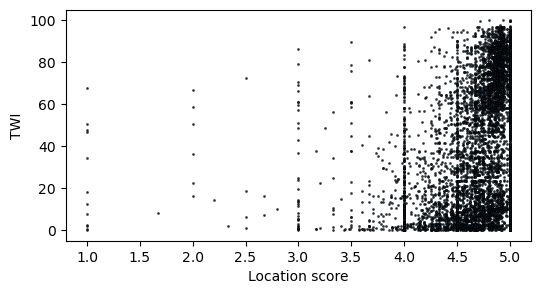

In [59]:
# Distribution of index as a function of location score
fig, ax = plt.subplots(figsize = (6, 3))
ax.scatter(df["location_score"], df["TWI"], 
           s=1, alpha=0.7, edgecolors="k")
#ax.set_xscale("log")
ax.set_xlabel("Location score")
ax.set_ylabel("TWI")

In [60]:
# Index interval classification
conditions = [
    (df['TWI'] > 20) & (df['TWI'] <= 40),
    (df['TWI'] > 40) & (df['TWI'] <= 60),
    (df['TWI'] > 60) & (df['TWI'] <= 80),
    (df['TWI'] > 80) & (df['TWI'] <= 100)]
choices_quali = ['Basic', 'Average', 'High', 'Excelent']
choices_quant = [2, 3, 4, 5]
df['Walkability'] = np.select(conditions, choices_quali, default='Poor')
df['Walkability_num'] = np.select(conditions, choices_quant, default=1)

df

,Hotel name,Longitude,Latitude,Count_A,Count_R,Metro_Tram_stop,Closeness_Centrality_Attractions,Closeness_Centrality_Restaurants,amenities_count,Review_count_H,...,Entertainment_Systems,Miscellaneous,avg_price_log,Count_A_Z,Count_R_Z,Bayes_mean_A,Bayes_mean_R,TWI,Walkability,Walkability_num
0,1,14.310830,40.837010,4.0,0.0,0,0.000149,0.000149,43,37,...,0,0,3.931826,-1.206833,-1.249834,4.059247,0.000000,1.596257,Poor,1
1,2,14.246360,40.869190,1.0,0.0,0,0.000232,0.000230,57,25,...,0,0,4.934474,-1.261523,-1.249834,4.042679,0.000000,0.399064,Poor,1
2,3,14.274350,40.853880,5.0,3.0,1,0.000285,0.000283,12,2,...,0,0,4.330733,-1.188603,-0.980251,4.042805,4.292601,4.945988,Poor,1
3,4,14.271396,40.855402,13.0,6.0,1,0.000298,0.000295,49,1,...,0,0,4.330733,-1.042764,-0.710669,4.066618,4.245952,11.089170,Poor,1
4,5,14.269357,40.859418,13.0,2.0,0,0.000286,0.000279,8,4,...,0,0,4.174387,-1.042764,-1.070112,4.041241,4.217639,7.154947,Poor,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7015,7022,14.222445,40.848753,6.0,4.0,1,0.000266,0.000311,27,2,...,0,0,4.262680,-1.170373,-0.890390,4.059135,4.334702,6.328608,Poor,1
7016,7023,14.266820,40.860320,15.0,0.0,0,0.000290,0.000282,26,1,...,0,0,4.779123,-1.006304,-1.249834,4.043644,0.000000,5.985965,Poor,1
7017,7024,14.224360,40.836690,10.0,4.0,0,0.000270,0.000327,21,2,...,0,0,4.595120,-1.097453,-0.890390,4.047370,4.146362,7.924865,Poor,1
7018,7025,14.231101,40.833801,19.0,4.0,0,0.000289,0.000351,7,39,...,0,0,4.189655,-0.933384,-0.890390,4.060045,4.194319,11.516444,Poor,1


<Axes: xlabel='Walkability', ylabel='Count'>

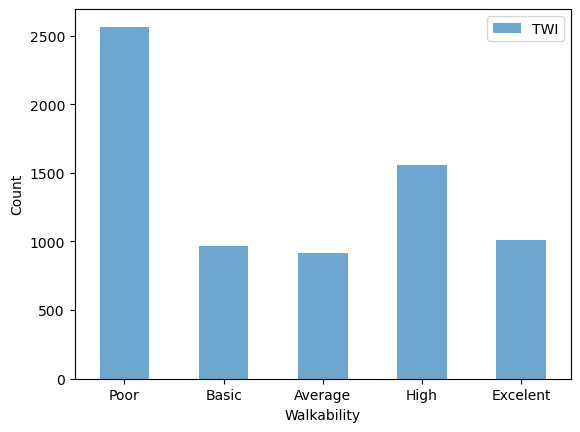

In [61]:
# Walkability index histogram
# Walkability index histogram
counts_for_plot = []
walkability_levels = ['Poor', 'Basic', 'Average', 'High', 'Excelent']
for i in walkability_levels:
    if i in df.Walkability.values:
        counts_for_plot.append(len(df[df.Walkability == i]))
    else:
        counts_for_plot.append(0)
        
counts_for_plot2 = [x * 100 / np.sum(counts_for_plot) for x in counts_for_plot] # As a percentage
pd.DataFrame({"Walkability":walkability_levels, "TWI":counts_for_plot}).plot.bar(x="Walkability", alpha=0.65, xlabel="Walkability", ylabel="Count", rot=0)

In [62]:
test_map = keplergl.KeplerGl(height = 800, config=kepler_config)

test_map.add_data(data=df)
test_map.add_data(data=df2, name="Attractions")
test_map.add_data(data=df3, name="Restaurants")
test_map.add_data(data=df4, name="Metro/Tram")
test_map

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


C:\Users\mario\anaconda3\Lib\site-packages\ipywidgets\widgets\widget.py:438: DeprecationWarning: The `ipykernel.comm.Comm` class has been deprecated. Please use the `comm` module instead.For creating comms, use the function `from comm import create_comm`.
  self.comm = Comm(**args)
C:\Users\mario\anaconda3\Lib\site-packages\jupyter_client\session.py:718: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)
C:\Users\mario\anaconda3\Lib\site-packages\jupyter_client\session.py:718: UserWarning: Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant
  content = self.pack(content)
C:\Users\mario\anaconda3\Lib\site-packages\jupyter_client\session.py:718: UserWarning: Message seri

KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': '2fxa7ht', 'type': …

In [63]:
test_map.config

{'version': 'v1',
 'config': {'visState': {'filters': [],
   'layers': [{'id': '2fxa7ht',
     'type': 'point',
     'config': {'dataId': 'unnamed',
      'label': 'Hotels',
      'color': [184, 110, 218],
      'highlightColor': [252, 242, 26, 255],
      'columns': {'lat': 'Latitude', 'lng': 'Longitude', 'altitude': None},
      'isVisible': False,
      'visConfig': {'radius': 4,
       'fixedRadius': False,
       'opacity': 1,
       'outline': False,
       'thickness': 2,
       'strokeColor': [240, 237, 234],
       'colorRange': {'name': 'Custom Palette',
        'type': 'custom',
        'category': 'Custom',
        'colors': ['#FF0000',
         '#FF3300',
         '#FF6600',
         '#FF9900',
         '#FFCC00',
         '#CCFF00',
         '#99FF00',
         '#66FF00',
         '#33FF00',
         '#00FF00']},
       'strokeColorRange': {'name': 'Global Warming',
        'type': 'sequential',
        'category': 'Uber',
        'colors': ['#5A1846',
         '#900C3F',

In [64]:
# Saving the map to html
test_map.save_to_html(file_name='kepler_map_Napoli_airbnb_15min.html')

Map saved to kepler_map_Napoli_airbnb_15min.html!


In [65]:
df["TWI"].to_excel("TWI_airbnb_Napoli.xlsx")

#### Price analysis

In [65]:
# Run this ONCE
df2 = df.copy()

In [66]:
df = df2

In [67]:
# Removing price outliers
Q1 = df['avg_price_log'].quantile(0.25)
Q3 = df['avg_price_log'].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 
df = df[(df['avg_price_log'] >= Q1 - 1.5 * IQR) & (df['avg_price_log'] <= Q3 + 1.5 *IQR)]

In [68]:
len(df)

6782

In [69]:
df.host_is_superhost.value_counts()
#df = df[df.host_is_superhost == "f"]

host_is_superhost
f    4459
t    2323
Name: count, dtype: int64

In [70]:
df['neighbourhood_cleansed'].replace(["Zona Industriale", "Bagnoli", "Poggioreale", 
                                    "Secondigliano", "San Giovanni a Teduccio", 
                                    "Piscinola", "San Pietro a Patierno", "Ponticelli", 
                                    "Soccavo", "Chiaiano", "Pianura", "Barra", "Miano", 
                                    "Scampia"], "Others", inplace=True)
df['neighbourhood_cleansed'].value_counts()

C:\Users\mario\AppData\Local\Temp\ipykernel_5864\1419789242.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['neighbourhood_cleansed'].replace(["Zona Industriale", "Bagnoli", "Poggioreale",
C:\Users\mario\AppData\Local\Temp\ipykernel_5864\1419789242.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['neighbourhood_cleansed'].replace(

neighbourhood_cleansed
San Lorenzo            1232
Pendino                 684
San Ferdinando          638
Montecalvario           523
Chiaia                  515
Avvocata                456
San Giuseppe            408
Porto                   368
Stella                  333
San Carlo all'Arena     323
Others                  303
Vomero                  292
Vicaria                 176
Arenella                156
Fuorigrotta             133
Mercato                 124
Posillipo               118
Name: count, dtype: int64

In [71]:
df.room_type.value_counts()
df = df[(df.room_type == "Entire home/apt") | (df.room_type == "Private room")]

In [72]:
df.property_type.value_counts()

property_type
Entire rental unit                    2741
Entire condo                          1093
Private room in bed and breakfast      717
Entire home                            565
Private room in rental unit            558
Entire vacation home                   287
Private room in condo                  205
Entire loft                            104
Tiny home                               72
Private room in home                    69
Room in boutique hotel                  57
Entire serviced apartment               38
Private room in serviced apartment      32
Private room in vacation home           31
Entire guest suite                      18
Private room in guest suite             17
Room in hotel                            8
Entire villa                             7
Private room in casa particular          7
Casa particular                          7
Private room                             6
Entire guesthouse                        6
Private room in loft                    

In [73]:
df['property_type'].replace(["Private room in home", "Tiny home", "Room in boutique hotel", "Entire serviced apartment", 
                            "Private room in serviced apartment", "Private room in vacation home", "Entire guest suite", 
                            "Private room in guest suite", "Room in hotel", "Entire villa", "Private room in casa particular", 
                            "Casa particular", "Private room", "Entire guesthouse", "Private room in loft", 
                            "Private room in villa", "Room in aparthotel", "Private room in townhouse", "Private room in hostel", 
                            "Private room in tiny home", "Private room in guesthouse", "Entire place", "Entire bed and breakfast", 
                            "Entire cottage", "Barn", "Dome", "Dammuso", "Earthen home", "Entire townhouse", 
                             "Private room in cabin"], "Others", inplace=True)
df['property_type'].value_counts()

C:\Users\mario\AppData\Local\Temp\ipykernel_5864\3857190313.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['property_type'].replace(["Private room in home", "Tiny home", "Room in boutique hotel", "Entire serviced apartment",


property_type
Entire rental unit                   2741
Entire condo                         1093
Private room in bed and breakfast     717
Entire home                           565
Private room in rental unit           558
Others                                412
Entire vacation home                  287
Private room in condo                 205
Entire loft                           104
Name: count, dtype: int64

In [74]:
# Grouping accommodates

#conditions = [
#    (df['accommodates'] <= 2),
#    (df['accommodates'] == 3),
#    (df['accommodates'] == 4),
#    (df['accommodates'] >= 5)
#]
#choices = [2, 3, 4, 5]

# Create a categorical column
#df['accommodates'] = np.select(conditions, choices)

In [75]:
df.bathrooms = np.ceil(df.bathrooms)
df.bathrooms = df.bathrooms.astype("int")
df['bathrooms'] = np.where(df['bathrooms'] >= 3, 3, df['bathrooms'])
df.bathrooms.value_counts()

bathrooms
1    5434
2    1076
3     172
Name: count, dtype: int64

In [76]:
df = df[df.bedrooms >= 1]
df['bedrooms'] = np.where(df['bedrooms'] >= 3, 3, df['bedrooms'])
df.bedrooms.value_counts()

bedrooms
1    4569
2    1516
3     443
Name: count, dtype: int64

In [77]:
df['beds'] = np.where(df['beds'] >= 4, 4, df['beds'])
df.beds.value_counts()

beds
2    2248
1    2167
3    1163
4     950
Name: count, dtype: int64

In [78]:
df['host_response_time'], _ = pd.factorize(df['host_response_time'])
df['host_is_superhost'], _ = pd.factorize(df['host_is_superhost'])
df['neighbourhood_cleansed'], _ = pd.factorize(df['neighbourhood_cleansed'])
df['property_type'], _ = pd.factorize(df['property_type'])
df['room_type'], _ = pd.factorize(df['room_type'])
df['Walkability'], _ = pd.factorize(df['Walkability'])

In [79]:
asdasdsa, _ = pd.factorize(df['property_type'])
_

Index([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype='int64')

In [80]:
# Get dummies
df_dummies = pd.get_dummies(df, columns = ["neighbourhood_cleansed",
                                          "property_type", "room_type", 
                                          "host_is_superhost", "bathrooms", 
                                          "bedrooms", "beds", "Walkability_num"], dtype = int)

In [81]:
df_dummies.drop(labels=['Hotel name', "Longitude", "Latitude", "Count_A", "Count_R", 
               "host_response_time", "host_response_rate", "host_acceptance_rate", 
               "Walkability", "Count_A_Z", "Count_R_Z"], axis=1, inplace=True)

In [82]:
# Export the DataFrame to Excel file
#df_dummies.to_excel("Napoli_dataframe_stat_analysis.xlsx")

In [83]:
len(df_dummies)

6528

In [84]:
# amenities_count accommodates bathrooms bedrooms beds minimum_nights maximum_nights availability_365 
# review_scores_accuracy review_scores_cleanliness review_scores_checkin review_scores_communication
# review_scores_value

#df_dummies.boxplot("Bayesian_avg_H")
#df_dummies.boxplot("Bayes_mean_A")
#df_dummies.boxplot("Bayes_mean_R")

#variables_outliers = ["TWI", "Bayesian_avg_H", "Bayes_mean_A", "Bayes_mean_R", "amenities_count", "accommodates", 
#                      "bathrooms", "bedrooms", "beds", "minimum_nights", "maximum_nights", "availability_365"] #,
                      #"review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin",
                      #"review_scores_communication", "review_scores_value", "location_score"]
        
#variables_outliers = ["accommodates", "minimum_nights", "maximum_nights", "availability_365", "bathrooms", "bedrooms", "beds"]#

# Removing outliers
#for outlier in variables_outliers:
#    Q1 = df_dummies[outlier].quantile(0.25)
#    Q3 = df_dummies[outlier].quantile(0.75)
#    IQR = Q3 - Q1    #IQR is interquartile range. 
#    df_dummies = df_dummies[(df_dummies[outlier] >= Q1 - 1.5 * IQR) & (df_dummies[outlier] <= Q3 + 1.5 *IQR)]

In [85]:
len(df_dummies)

6528

In [86]:
# Scaling the variables that are not scalated
from sklearn.preprocessing import StandardScaler, RobustScaler
scaler = RobustScaler()

In [87]:
columns_to_scale_avg_price = ["TWI", "accommodates", "minimum_nights", "maximum_nights", "availability_365", 
                             "amenities_count", "Bayesian_avg_H", 'review_scores_accuracy', 'review_scores_cleanliness',
                               'review_scores_checkin', 'review_scores_communication',
                               'review_scores_value', 'Bayes_mean_A', 'Bayes_mean_R', 'location_score', "Review_count_H", 
                             "Score_H"]

df_dummies_no_scale = df_dummies.copy()

df_dummies[columns_to_scale_avg_price] = scaler.fit_transform(df_dummies[columns_to_scale_avg_price])

C:\Users\mario\anaconda3\Lib\site-packages\pandas\core\algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  return lib.map_infer(values, mapper, convert=convert)
C:\Users\mario\anaconda3\Lib\site-packages\sklearn\utils\validation.py:605: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\mario\anaconda3\Lib\site-packages\sklearn\utils\validation.py:614: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\mario\anaconda3\Lib\site-packages\pandas\core\algorithms.py:1743: DeprecationWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  re

In [88]:
df_dummies.columns

Index(['Metro_Tram_stop', 'Closeness_Centrality_Attractions',
       'Closeness_Centrality_Restaurants', 'amenities_count', 'Review_count_H',
       'Score_H', 'Bayesian_avg_H', 'price', 'location_score', 'accommodates',
       'minimum_nights', 'maximum_nights', 'availability_365',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_value', 'TVs', 'Wifi', 'Kitchen_Appliances', 'Parking',
       'Child_Amenities', 'Bathroom_Amenities', 'Entertainment_Systems',
       'Miscellaneous', 'avg_price_log', 'Bayes_mean_A', 'Bayes_mean_R', 'TWI',
       'neighbourhood_cleansed_0', 'neighbourhood_cleansed_1',
       'neighbourhood_cleansed_2', 'neighbourhood_cleansed_3',
       'neighbourhood_cleansed_4', 'neighbourhood_cleansed_5',
       'neighbourhood_cleansed_6', 'neighbourhood_cleansed_7',
       'neighbourhood_cleansed_8', 'neighbourhood_cleansed_9',
       'neighbourhood_cleansed_10', 'neighbou

In [89]:
from scipy.stats import pointbiserialr, pearsonr, chi2_contingency
binary_cols = ["Metro_Tram_stop", 'neighbourhood_cleansed_0',
                   'neighbourhood_cleansed_1', 'neighbourhood_cleansed_2',
                   'neighbourhood_cleansed_3', 'neighbourhood_cleansed_4',
                   'neighbourhood_cleansed_5', 'neighbourhood_cleansed_6',
                   'neighbourhood_cleansed_7', 'neighbourhood_cleansed_8',
                   'neighbourhood_cleansed_9', 'neighbourhood_cleansed_10',
                   'neighbourhood_cleansed_11', 'neighbourhood_cleansed_12',
                   'neighbourhood_cleansed_13', 'neighbourhood_cleansed_14',
                   'neighbourhood_cleansed_15', "neighbourhood_cleansed_16", 'property_type_0', 'property_type_1',
                   'property_type_2', 'property_type_3', 'property_type_4',
                   'property_type_5', 'property_type_6', 'property_type_7',
                   'property_type_8', 
                   "bathrooms_1", "bathrooms_2", 
                      "bathrooms_3",  "bedrooms_2", "bedrooms_3",  
                      "beds_2", "beds_3",  'TVs', 'Wifi', 'Kitchen_Appliances', 'Parking',
       'Child_Amenities', 'Bathroom_Amenities', 'Entertainment_Systems', 'Miscellaneous', 
              "Walkability_num_1", "Walkability_num_2", "Walkability_num_3", "Walkability_num_4", "Walkability_num_5"]
continuous_cols = ["Bayesian_avg_H", "location_score", "accommodates",  
                   "availability_365", "maximum_nights", "minimum_nights", 
                  "Bayes_mean_A", "Bayes_mean_R", "Review_count_H", "review_scores_cleanliness", "amenities_count"]

# Initialize a list to store the results
correlation_results = []

# Compute point biserial correlation for each pair of binary and continuous variables
for binary_col in binary_cols:
    for continuous_col in continuous_cols:
        r_pb, p_value = pointbiserialr(df_dummies[binary_col], df_dummies[continuous_col])
        if r_pb >= 0.5 or r_pb <= -0.5:
            correlation_results.append({
                'type': 'Point Biserial',
                'variable1': binary_col,
                'variable2': continuous_col,
                'correlation': r_pb,
                'p_value': p_value
            })

# Compute Cramér's V for each pair of binary variables
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    return np.sqrt(chi2 / (n * (min(confusion_matrix.shape) - 1)))

for i, binary_col1 in enumerate(binary_cols):
    for binary_col2 in binary_cols[i+1:]:
        confusion_matrix = pd.crosstab(df_dummies[binary_col1], df_dummies[binary_col2])
        cramer_v = cramers_v(confusion_matrix)
        if cramer_v >= 0.5:
            correlation_results.append({
                'type': 'Cramér\'s V',
                'variable1': binary_col1,
                'variable2': binary_col2,
                'correlation': cramer_v,
                'p_value': None  # Cramér's V does not have a p-value
            })

# Compute Pearson correlation for each pair of continuous variables
for i, continuous_col1 in enumerate(continuous_cols):
    for continuous_col2 in continuous_cols[i+1:]:
        pearson_corr, p_value = pearsonr(df_dummies[continuous_col1], df_dummies[continuous_col2])
        if pearson_corr >= 0.5 or pearson_corr <= -0.5:
            correlation_results.append({
                'type': 'Pearson',
                'variable1': continuous_col1,
                'variable2': continuous_col2,
                'correlation': pearson_corr,
                'p_value': p_value
            })

# Display the results
for result in correlation_results:
    print(f"Type: {result['type']}, Var 1: {result['variable1']}, "
          f"Var 2: {result['variable2']}, Corr: {result['correlation']}, "
          f"P-value: {result.get('p_value', 'N/A')}")
    
# "Closeness_Centrality_Attractions", "Closeness_Centrality_Restaurants", "amenities_count", 
# 'host_is_superhost_0', 'host_is_superhost_1' , 'room_type_0', 'room_type_1'
# "bedrooms_1", "beds_1", , "Score_H", , "beds_4", "review_scores_accuracy"
# , "review_scores_checkin", , "review_scores_communication", "review_scores_value"

Type: Cramér's V, Var 1: bathrooms_1, Var 2: bathrooms_2, Corr: 0.9130217058482402, P-value: None


In [90]:
variables=['neighbourhood_cleansed_0',
                   'neighbourhood_cleansed_1', 'neighbourhood_cleansed_2',
                   'neighbourhood_cleansed_4',
                   'neighbourhood_cleansed_5', 'neighbourhood_cleansed_6',
                   'neighbourhood_cleansed_7', 'neighbourhood_cleansed_8',
                   'neighbourhood_cleansed_9', 'neighbourhood_cleansed_10',
                   'neighbourhood_cleansed_11', 'neighbourhood_cleansed_12',
                   'neighbourhood_cleansed_13', 'neighbourhood_cleansed_14',
                   'neighbourhood_cleansed_15', "neighbourhood_cleansed_16", 'property_type_1',
                   'property_type_2', 'property_type_3', 'property_type_4',
                   'property_type_5', 'property_type_6', 'property_type_7',
                   'property_type_8', "bathrooms_2", 
                      "bathrooms_3",  "bedrooms_2", "bedrooms_3",  
                      "beds_2", "beds_3",  'TVs', 'Parking',
       'Child_Amenities', 'Entertainment_Systems', 'Miscellaneous', 
           "Walkability_num_2", "Walkability_num_3", "Walkability_num_4", "Walkability_num_5", 
          "Bayesian_avg_H", "location_score", "accommodates",  
                   "availability_365", "maximum_nights", "minimum_nights", 
                  "Bayes_mean_A", "Bayes_mean_R", "Review_count_H", "review_scores_cleanliness", "amenities_count"]

# Calculate VIF for the provided list of variables
vif_results = [
    (variables[i], variance_inflation_factor(df_dummies[variables].values, i))
    for i in range(len(variables))
    if variance_inflation_factor(df_dummies[variables].values, i) > 5
]
vif_results
# , 'Wifi', 'Kitchen_Appliances', "Metro_Tram_stop", 'Bathroom_Amenities'

[]

In [91]:
# Multiple linear regression
# Before removing high VIF variables
formula1 = ("avg_price_log ~ Wifi + Kitchen_Appliances + Metro_Tram_stop + Bathroom_Amenities + neighbourhood_cleansed_0 + neighbourhood_cleansed_1 + neighbourhood_cleansed_2 + neighbourhood_cleansed_4 + neighbourhood_cleansed_5 + neighbourhood_cleansed_6 + neighbourhood_cleansed_7 + neighbourhood_cleansed_8 + neighbourhood_cleansed_9 + neighbourhood_cleansed_10 + neighbourhood_cleansed_11 + neighbourhood_cleansed_12 + neighbourhood_cleansed_13 + neighbourhood_cleansed_14 + neighbourhood_cleansed_15 + neighbourhood_cleansed_16 + property_type_1 + property_type_2 + property_type_3 + property_type_4 + property_type_5 + property_type_6 + property_type_7 + property_type_8 + bathrooms_2 + bathrooms_3 + bedrooms_2 + bedrooms_3 + beds_2 + beds_3 + TVs + Parking + Child_Amenities + Entertainment_Systems + Miscellaneous + Walkability_num_2 + Walkability_num_3 + Walkability_num_4 + Walkability_num_5 + Bayesian_avg_H + location_score + accommodates + availability_365 + maximum_nights + minimum_nights + Bayes_mean_A + Bayes_mean_R + Review_count_H + review_scores_cleanliness + amenities_count")

# After removing high VIF variables with the previous chunk
formula2 = ("avg_price_log ~ neighbourhood_cleansed_0 + neighbourhood_cleansed_1 + neighbourhood_cleansed_2 + neighbourhood_cleansed_4 + neighbourhood_cleansed_5 + neighbourhood_cleansed_6 + neighbourhood_cleansed_7 + neighbourhood_cleansed_8 + neighbourhood_cleansed_9 + neighbourhood_cleansed_10 + neighbourhood_cleansed_11 + neighbourhood_cleansed_12 + neighbourhood_cleansed_13 + neighbourhood_cleansed_14 + neighbourhood_cleansed_15 + neighbourhood_cleansed_16 + property_type_1 + property_type_2 + property_type_3 + property_type_4 + property_type_5 + property_type_6 + property_type_7 + property_type_8 + bathrooms_2 + bathrooms_3 + bedrooms_2 + bedrooms_3 + beds_2 + beds_3 + TVs + Parking + Child_Amenities + Entertainment_Systems + Miscellaneous + Walkability_num_2 + Walkability_num_3 + Walkability_num_4 + Walkability_num_5 + Bayesian_avg_H + location_score + accommodates + availability_365 + maximum_nights + minimum_nights + Bayes_mean_A + Bayes_mean_R + Review_count_H + review_scores_cleanliness + amenities_count")

# Quadratic test (without interaction effects)
#formula3 = ("avg_price_log ~ (neighbourhood_cleansed_0 + I(neighbourhood_cleansed_0 ** 2)) + (neighbourhood_cleansed_1 + I(neighbourhood_cleansed_1 ** 2)) + (neighbourhood_cleansed_3 + I(neighbourhood_cleansed_3 ** 2)) + (neighbourhood_cleansed_4 + I(neighbourhood_cleansed_4 ** 2)) + (neighbourhood_cleansed_5 + I(neighbourhood_cleansed_5 ** 2)) + (neighbourhood_cleansed_6 + I(neighbourhood_cleansed_6 ** 2)) + (neighbourhood_cleansed_7 + I(neighbourhood_cleansed_7 ** 2)) + (neighbourhood_cleansed_10 + I(neighbourhood_cleansed_10 ** 2)) + (neighbourhood_cleansed_11 + I(neighbourhood_cleansed_11 ** 2)) + (neighbourhood_cleansed_12 + I(neighbourhood_cleansed_12 ** 2)) + (neighbourhood_cleansed_13 + I(neighbourhood_cleansed_13 ** 2)) + (neighbourhood_cleansed_15 + I(neighbourhood_cleansed_15 ** 2)) + (property_type_1 + I(property_type_1 ** 2)) + (property_type_2 + I(property_type_2 ** 2)) + (property_type_3 + I(property_type_3 ** 2)) + (property_type_4 + I(property_type_4 ** 2)) + (property_type_5 + I(property_type_5 ** 2)) + (property_type_7 + I(property_type_7 ** 2)) + (property_type_9 + I(property_type_9 ** 2)) + (property_type_11 + I(property_type_11 ** 2)) + (property_type_12 + I(property_type_12 ** 2)) + (property_type_15 + I(property_type_15 ** 2)) + (property_type_19 + I(property_type_19 ** 2)) + (property_type_26 + I(property_type_26 ** 2)) + (property_type_31 + I(property_type_31 ** 2)) + (property_type_34 + I(property_type_34 ** 2)) + (property_type_35 + I(property_type_35 ** 2)) + (bathrooms_2 + I(bathrooms_2 ** 2)) + (bathrooms_3 + I(bathrooms_3 ** 2)) + (bedrooms_2 + I(bedrooms_2 ** 2)) + (bedrooms_3 + I(bedrooms_3 ** 2)) + (Parking + I(Parking ** 2)) + (Child_Amenities + I(Child_Amenities ** 2)) + (Entertainment_Systems + I(Entertainment_Systems ** 2)) + (Walkability_num_2 + I(Walkability_num_2 ** 2)) + (Walkability_num_3 + I(Walkability_num_3 ** 2)) + (Walkability_num_4 + I(Walkability_num_4 ** 2)) + (Walkability_num_5 + I(Walkability_num_5 ** 2)) + (Bayesian_avg_H + I(Bayesian_avg_H ** 2)) + (accommodates + I(accommodates ** 2)) + (availability_365 + I(availability_365 ** 2)) + (minimum_nights + I(minimum_nights ** 2)) + (Bayes_mean_A + I(Bayes_mean_A ** 2)) + (Review_count_H + I(Review_count_H ** 2)) + (review_scores_cleanliness + I(review_scores_cleanliness ** 2))")

# Quadratic test (without interaction effects)
#formula4 = ("avg_price_log ~ neighbourhood_cleansed_0 + I(neighbourhood_cleansed_0 ** 2) + neighbourhood_cleansed_1 + I(neighbourhood_cleansed_1 ** 2) + neighbourhood_cleansed_3 + I(neighbourhood_cleansed_3 ** 2) + neighbourhood_cleansed_4 + I(neighbourhood_cleansed_4 ** 2) + neighbourhood_cleansed_5 + I(neighbourhood_cleansed_5 ** 2) + neighbourhood_cleansed_6 + I(neighbourhood_cleansed_6 ** 2) + neighbourhood_cleansed_7 + I(neighbourhood_cleansed_7 ** 2) + neighbourhood_cleansed_10 + I(neighbourhood_cleansed_10 ** 2) + neighbourhood_cleansed_11 + I(neighbourhood_cleansed_11 ** 2) + neighbourhood_cleansed_12 + I(neighbourhood_cleansed_12 ** 2) + neighbourhood_cleansed_13 + I(neighbourhood_cleansed_13 ** 2) + neighbourhood_cleansed_15 + I(neighbourhood_cleansed_15 ** 2) + property_type_1 + I(property_type_1 ** 2) + property_type_2 + I(property_type_2 ** 2) + property_type_3 + I(property_type_3 ** 2) + property_type_4 + I(property_type_4 ** 2) + property_type_5 + I(property_type_5 ** 2) + property_type_7 + I(property_type_7 ** 2) + property_type_9 + I(property_type_9 ** 2) + property_type_11 + I(property_type_11 ** 2) + property_type_12 + I(property_type_12 ** 2) + property_type_15 + I(property_type_15 ** 2) + property_type_19 + I(property_type_19 ** 2) + property_type_26 + I(property_type_26 ** 2) + property_type_31 + I(property_type_31 ** 2) + property_type_34 + I(property_type_34 ** 2) + property_type_35 + I(property_type_35 ** 2) + bathrooms_2 + I(bathrooms_2 ** 2) + bathrooms_3 + I(bathrooms_3 ** 2) + bedrooms_2 + I(bedrooms_2 ** 2) + bedrooms_3 + I(bedrooms_3 ** 2) + Parking + I(Parking ** 2) + Child_Amenities + I(Child_Amenities ** 2) + Entertainment_Systems + I(Entertainment_Systems ** 2) + Walkability_num_2 + I(Walkability_num_2 ** 2) + Walkability_num_3 + I(Walkability_num_3 ** 2) + Walkability_num_4 + I(Walkability_num_4 ** 2) + Walkability_num_5 + I(Walkability_num_5 ** 2) + Bayesian_avg_H + I(Bayesian_avg_H ** 2) + accommodates + I(accommodates ** 2) + availability_365 + I(availability_365 ** 2) + minimum_nights + I(minimum_nights ** 2) + Bayes_mean_A + I(Bayes_mean_A ** 2) + Review_count_H + I(Review_count_H ** 2) + review_scores_cleanliness + I(review_scores_cleanliness ** 2) + neighbourhood_cleansed_0:neighbourhood_cleansed_1 + neighbourhood_cleansed_0:neighbourhood_cleansed_3 + neighbourhood_cleansed_0:neighbourhood_cleansed_4 + neighbourhood_cleansed_0:neighbourhood_cleansed_5 + neighbourhood_cleansed_0:neighbourhood_cleansed_6 + neighbourhood_cleansed_0:neighbourhood_cleansed_7 + neighbourhood_cleansed_0:neighbourhood_cleansed_10 + neighbourhood_cleansed_0:neighbourhood_cleansed_11 + neighbourhood_cleansed_0:neighbourhood_cleansed_12 + neighbourhood_cleansed_0:neighbourhood_cleansed_13 + neighbourhood_cleansed_0:neighbourhood_cleansed_15 + neighbourhood_cleansed_1:neighbourhood_cleansed_3 + neighbourhood_cleansed_1:neighbourhood_cleansed_4 + neighbourhood_cleansed_1:neighbourhood_cleansed_5 + neighbourhood_cleansed_1:neighbourhood_cleansed_6 + neighbourhood_cleansed_1:neighbourhood_cleansed_7 + neighbourhood_cleansed_1:neighbourhood_cleansed_10 + neighbourhood_cleansed_1:neighbourhood_cleansed_11 + neighbourhood_cleansed_1:neighbourhood_cleansed_12 + neighbourhood_cleansed_1:neighbourhood_cleansed_13 + neighbourhood_cleansed_1:neighbourhood_cleansed_15 + neighbourhood_cleansed_3:neighbourhood_cleansed_4 + neighbourhood_cleansed_3:neighbourhood_cleansed_5 + neighbourhood_cleansed_3:neighbourhood_cleansed_6 + neighbourhood_cleansed_3:neighbourhood_cleansed_7 + neighbourhood_cleansed_3:neighbourhood_cleansed_10 + neighbourhood_cleansed_3:neighbourhood_cleansed_11 + neighbourhood_cleansed_3:neighbourhood_cleansed_12 + neighbourhood_cleansed_3:neighbourhood_cleansed_13 + neighbourhood_cleansed_3:neighbourhood_cleansed_15 + neighbourhood_cleansed_4:neighbourhood_cleansed_5 + neighbourhood_cleansed_4:neighbourhood_cleansed_6 + neighbourhood_cleansed_4:neighbourhood_cleansed_7 + neighbourhood_cleansed_4:neighbourhood_cleansed_10 + neighbourhood_cleansed_4:neighbourhood_cleansed_11 + neighbourhood_cleansed_4:neighbourhood_cleansed_12 + neighbourhood_cleansed_4:neighbourhood_cleansed_13 + neighbourhood_cleansed_4:neighbourhood_cleansed_15 + neighbourhood_cleansed_5:neighbourhood_cleansed_6 + neighbourhood_cleansed_5:neighbourhood_cleansed_7 + neighbourhood_cleansed_5:neighbourhood_cleansed_10 + neighbourhood_cleansed_5:neighbourhood_cleansed_11 + neighbourhood_cleansed_5:neighbourhood_cleansed_12 + neighbourhood_cleansed_5:neighbourhood_cleansed_13 + neighbourhood_cleansed_5:neighbourhood_cleansed_15 + neighbourhood_cleansed_6:neighbourhood_cleansed_7 + neighbourhood_cleansed_6:neighbourhood_cleansed_10 + neighbourhood_cleansed_6:neighbourhood_cleansed_11 + neighbourhood_cleansed_6:neighbourhood_cleansed_12 + neighbourhood_cleansed_6:neighbourhood_cleansed_13 + neighbourhood_cleansed_6:neighbourhood_cleansed_15 + neighbourhood_cleansed_7:neighbourhood_cleansed_10 + neighbourhood_cleansed_7:neighbourhood_cleansed_11 + neighbourhood_cleansed_7:neighbourhood_cleansed_12 + neighbourhood_cleansed_7:neighbourhood_cleansed_13 + neighbourhood_cleansed_7:neighbourhood_cleansed_15 + neighbourhood_cleansed_10:neighbourhood_cleansed_11 + neighbourhood_cleansed_10:neighbourhood_cleansed_12 + neighbourhood_cleansed_10:neighbourhood_cleansed_13 + neighbourhood_cleansed_10:neighbourhood_cleansed_15 + neighbourhood_cleansed_11:neighbourhood_cleansed_12 + neighbourhood_cleansed_11:neighbourhood_cleansed_13 + neighbourhood_cleansed_11:neighbourhood_cleansed_15 + neighbourhood_cleansed_12:neighbourhood_cleansed_13 + neighbourhood_cleansed_12:neighbourhood_cleansed_15 + neighbourhood_cleansed_13:neighbourhood_cleansed_15 + property_type_1:property_type_2 + property_type_1:property_type_3 + property_type_1:property_type_4 + property_type_1:property_type_5 + property_type_1:property_type_7 + property_type_1:property_type_9 + property_type_1:property_type_11 + property_type_1:property_type_12 + property_type_1:property_type_15 + property_type_1:property_type_19 + property_type_1:property_type_26 + property_type_1:property_type_31 + property_type_1:property_type_34 + property_type_1:property_type_35 + property_type_2:property_type_3 + property_type_2:property_type_4 + property_type_2:property_type_5 + property_type_2:property_type_7 + property_type_2:property_type_9 + property_type_2:property_type_11 + property_type_2:property_type_12")

model_lr = ols(formula2,  
            data=df_dummies)

results_lr = model_lr.fit()
results_lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          avg_price_log   R-squared:                       0.379
Model:                            OLS   Adj. R-squared:                  0.374
Method:                 Least Squares   F-statistic:                     78.96
Date:                Thu, 25 Jul 2024   Prob (F-statistic):               0.00
Time:                        17:27:57   Log-Likelihood:                -2395.8
No. Observations:                6528   AIC:                             4894.
Df Residuals:                    6477   BIC:                             5240.
Df Model:                          50                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     4.3089      0.022    198.199      0.000       4.266       4.351
neighbourhood_cleansed_0     -0.0449      0.028     -1.616      0.106      -0.099       0.010
neighbourhood_cleansed_1     -0.0808      0.024     -3.355      0.001      -0.128      -0.034
neighbourhood_cleansed_2      0.0332      0.031      1.066      0.286      -0.028       0.094
neighbourhood_cleansed_4      0.0154      0.021      0.742      0.458      -0.025       0.056
neighbourhood_cleansed_5     -0.0008      0.019     -0.039      0.969      -0.039       0.037
neighbourhood_cleansed_6      0.0234      0.018      1.316      0.188      -0.011       0.058
neighbourhood_cleansed_7      0.1485      0.019      7.868      0.000       0.112       0.186
neighbourhood_cleansed_8      0.0082      0.036      0.231      0.817      -0.062       0.078
neighbourhood_cleansed_9      0.0684      0.023      3.027      0.002       0.024       0.113
neighbourhood_cleansed_10     0.2876      0.038      7.627      0.000       0.214       0.361
neighbourhood_cleansed_11    -0.0831      0.023     -3.597      0.000      -0.128      -0.038
neighbourhood_cleansed_12     0.2213      0.021     10.535      0.000       0.180       0.263
neighbourhood_cleansed_13     0.1888      0.027      7.033      0.000       0.136       0.241
neighbourhood_cleansed_14     0.0211      0.033      0.644      0.519      -0.043       0.085
neighbourhood_cleansed_15    -0.0300      0.036     -0.835      0.404      -0.101       0.040
neighbourhood_cleansed_16     0.1140      0.023      5.010      0.000       0.069       0.159
property_type_1              -0.0609      0.022     -2.728      0.006      -0.105      -0.017
property_type_2              -0.1131      0.018     -6.410      0.000      -0.148      -0.079
property_type_3               0.1080      0.016      6.600      0.000       0.076       0.140
property_type_4               0.0869      0.019      4.466      0.000       0.049       0.125
property_type_5              -0.0733      0.017     -4.400      0.000      -0.106      -0.041
property_type_6              -0.1308      0.026     -4.957      0.000      -0.183      -0.079
property_type_7               0.0630      0.036      1.740      0.082      -0.008       0.134
property_type_8               0.0296      0.013      2.298      0.022       0.004       0.055
bathrooms_2                   0.1167      0.013      8.689      0.000       0.090       0.143
bathrooms_3                   0.1920      0.031      6.135      0.000       0.131       0.253
bedrooms_2                    0.0962      0.013      7.464      0.000       0.071       0.122
bedrooms_3                    0.1888      0.024      7.886      0.000       0.142       0.236
beds_2                       -0.0014      0.010     -0.141      0.888      

In [92]:
# Perform backward elimination

while True:
    p_values = results_lr.pvalues.iloc[1:]  # Exclude intercept
    max_p_value = p_values.max()
    if max_p_value > 0.05:
        excluded_feature = p_values.idxmax()
        formula = model_lr.formula.replace(f" + {excluded_feature}", "").replace(f"{excluded_feature} + ", "")
        model_lr = ols(formula, data=df_dummies)
        results_lr = model_lr.fit()
        print(f"Excluding {excluded_feature} with p-value {max_p_value}")
    else:
        break
results_lr.summary()

Excluding neighbourhood_cleansed_5 with p-value 0.9685651920173146
Excluding beds_2 with p-value 0.8872371595699231
Excluding neighbourhood_cleansed_8 with p-value 0.8079141060909267
Excluding location_score with p-value 0.7573813479372744
Excluding TVs with p-value 0.6304834201706493
Excluding beds_3 with p-value 0.6107850839061926
Excluding neighbourhood_cleansed_14 with p-value 0.5114680187785834
Excluding neighbourhood_cleansed_4 with p-value 0.5052834429165192
Excluding neighbourhood_cleansed_2 with p-value 0.384448760887078
Excluding maximum_nights with p-value 0.3156882499038781
Excluding neighbourhood_cleansed_15 with p-value 0.21854772290815314
Excluding neighbourhood_cleansed_6 with p-value 0.19919203106939
Excluding Bayes_mean_R with p-value 0.16033140199467805
Excluding amenities_count with p-value 0.14054400310136916
Excluding Miscellaneous with p-value 0.08914221317285374
Excluding property_type_7 with p-value 0.07521448675561819
Excluding Bayes_mean_A with p-value 0.0659

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          avg_price_log   R-squared:                       0.376
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     122.5
Date:                Thu, 25 Jul 2024   Prob (F-statistic):               0.00
Time:                        17:27:59   Log-Likelihood:                -2407.7
No. Observations:                6528   AIC:                             4881.
Df Residuals:                    6495   BIC:                             5105.
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     4.3190      0.014    299.676      0.000       4.291       4.347
neighbourhood_cleansed_0     -0.0787      0.023     -3.475      0.001      -0.123      -0.034
neighbourhood_cleansed_1     -0.0925      0.022     -4.284      0.000      -0.135      -0.050
neighbourhood_cleansed_7      0.1423      0.016      8.720      0.000       0.110       0.174
neighbourhood_cleansed_9      0.0647      0.021      3.072      0.002       0.023       0.106
neighbourhood_cleansed_10     0.2692      0.035      7.797      0.000       0.202       0.337
neighbourhood_cleansed_11    -0.0900      0.021     -4.263      0.000      -0.131      -0.049
neighbourhood_cleansed_12     0.2165      0.018     12.237      0.000       0.182       0.251
neighbourhood_cleansed_13     0.1875      0.023      8.147      0.000       0.142       0.233
neighbourhood_cleansed_16     0.1102      0.022      5.099      0.000       0.068       0.153
property_type_1              -0.0664      0.022     -2.990      0.003      -0.110      -0.023
property_type_2              -0.1144      0.017     -6.574      0.000      -0.149      -0.080
property_type_3               0.1097      0.016      6.839      0.000       0.078       0.141
property_type_4               0.0864      0.019      4.476      0.000       0.049       0.124
property_type_5              -0.0774      0.017     -4.676      0.000      -0.110      -0.045
property_type_6              -0.1311      0.026     -5.005      0.000      -0.182      -0.080
property_type_8               0.0271      0.013      2.133      0.033       0.002       0.052
bathrooms_2                   0.1171      0.013      8.751      0.000       0.091       0.143
bathrooms_3                   0.1913      0.031      6.128      0.000       0.130       0.252
bedrooms_2                    0.0945      0.013      7.466      0.000       0.070       0.119
bedrooms_3                    0.1883      0.024      8.002      0.000       0.142       0.234
Parking                       0.0326      0.010      3.396      0.001       0.014       0.051
Child_Amenities               0.0672      0.010      6.985      0.000       0.048       0.086
Walkability_num_2             0.0891      0.015      5.987      0.000       0.060       0.118
Walkability_num_3             0.1239      0.015      8.036      0.000       0.094       0.154
Walkability_num_4             0.1459      0.014     10.209      0.000       0.118       0.174
Walkability_num_5             0.1808      0.018     10.273      0.000       0.146       0.215
Bayesian_avg_H                0.0543      0.004     12.777      0.000       0.046       0.063
accommodates                  0.1282      0.007     17.707      0.000       0.114       0.142
availability_365              0.0816      0.007     11.069      0.000      

In [93]:
model_lr.formula

'avg_price_log ~ neighbourhood_cleansed_0 + neighbourhood_cleansed_1 + neighbourhood_cleansed_7 + neighbourhood_cleansed_9 + neighbourhood_cleansed_10 + neighbourhood_cleansed_11 + neighbourhood_cleansed_12 + neighbourhood_cleansed_13 + neighbourhood_cleansed_16 + property_type_1 + property_type_2 + property_type_3 + property_type_4 + property_type_5 + property_type_6 + property_type_8 + bathrooms_2 + bathrooms_3 + bedrooms_2 + bedrooms_3 + Parking + Child_Amenities + Walkability_num_2 + Walkability_num_3 + Walkability_num_4 + Walkability_num_5 + Bayesian_avg_H + accommodates + availability_365 + minimum_nights + Review_count_H + review_scores_cleanliness'

In [94]:
# Multiple linear regression

model_lr = ols('avg_price_log ~ Walkability_num_2 + Walkability_num_3 + Walkability_num_4 + Walkability_num_5 + neighbourhood_cleansed_0 + neighbourhood_cleansed_1 + neighbourhood_cleansed_7 + neighbourhood_cleansed_9 + neighbourhood_cleansed_10 + neighbourhood_cleansed_11 + neighbourhood_cleansed_12 + neighbourhood_cleansed_13 + neighbourhood_cleansed_16 + property_type_1 + property_type_2 + property_type_3 + property_type_4 + property_type_5 + property_type_6 + property_type_8 + bathrooms_2 + bathrooms_3 + bedrooms_2 + bedrooms_3 + Parking + Child_Amenities + Bayesian_avg_H + accommodates + availability_365 + minimum_nights + Review_count_H + review_scores_cleanliness',  
            data=df_dummies)
# 
results_lr = model_lr.fit()
results_lr.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          avg_price_log   R-squared:                       0.376
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     122.5
Date:                Thu, 25 Jul 2024   Prob (F-statistic):               0.00
Time:                        17:27:59   Log-Likelihood:                -2407.7
No. Observations:                6528   AIC:                             4881.
Df Residuals:                    6495   BIC:                             5105.
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
=============================================================================================
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept                     4.3190      0.014    299.676      0.000       4.291       4.347
Walkability_num_2             0.0891      0.015      5.987      0.000       0.060       0.118
Walkability_num_3             0.1239      0.015      8.036      0.000       0.094       0.154
Walkability_num_4             0.1459      0.014     10.209      0.000       0.118       0.174
Walkability_num_5             0.1808      0.018     10.273      0.000       0.146       0.215
neighbourhood_cleansed_0     -0.0787      0.023     -3.475      0.001      -0.123      -0.034
neighbourhood_cleansed_1     -0.0925      0.022     -4.284      0.000      -0.135      -0.050
neighbourhood_cleansed_7      0.1423      0.016      8.720      0.000       0.110       0.174
neighbourhood_cleansed_9      0.0647      0.021      3.072      0.002       0.023       0.106
neighbourhood_cleansed_10     0.2692      0.035      7.797      0.000       0.202       0.337
neighbourhood_cleansed_11    -0.0900      0.021     -4.263      0.000      -0.131      -0.049
neighbourhood_cleansed_12     0.2165      0.018     12.237      0.000       0.182       0.251
neighbourhood_cleansed_13     0.1875      0.023      8.147      0.000       0.142       0.233
neighbourhood_cleansed_16     0.1102      0.022      5.099      0.000       0.068       0.153
property_type_1              -0.0664      0.022     -2.990      0.003      -0.110      -0.023
property_type_2              -0.1144      0.017     -6.574      0.000      -0.149      -0.080
property_type_3               0.1097      0.016      6.839      0.000       0.078       0.141
property_type_4               0.0864      0.019      4.476      0.000       0.049       0.124
property_type_5              -0.0774      0.017     -4.676      0.000      -0.110      -0.045
property_type_6              -0.1311      0.026     -5.005      0.000      -0.182      -0.080
property_type_8               0.0271      0.013      2.133      0.033       0.002       0.052
bathrooms_2                   0.1171      0.013      8.751      0.000       0.091       0.143
bathrooms_3                   0.1913      0.031      6.128      0.000       0.130       0.252
bedrooms_2                    0.0945      0.013      7.466      0.000       0.070       0.119
bedrooms_3                    0.1883      0.024      8.002      0.000       0.142       0.234
Parking                       0.0326      0.010      3.396      0.001       0.014       0.051
Child_Amenities               0.0672      0.010      6.985      0.000       0.048       0.086
Bayesian_avg_H                0.0543      0.004     12.777      0.000       0.046       0.063
accommodates                  0.1282      0.007     17.707      0.000       0.114       0.142
availability_365              0.0816      0.007     11.069      0.000      

In [95]:
# Variance Inflation Factor (impact over Standard Error (accuracy of estimated coefficients))
# [(list(results_lr.pvalues.iloc[1:].index)[i], variance_inflation_factor(df_dummies[list(results_lr.pvalues.iloc[1:].index)], i)) for i in range(0, len(list(results_lr.pvalues.iloc[1:].index)))]
[(list(results_lr.pvalues.iloc[1:].index)[i], variance_inflation_factor(df_dummies[list(results_lr.pvalues.iloc[1:].index)], i)) for i in range(0, len(list(results_lr.pvalues.iloc[1:].index))) if variance_inflation_factor(df_dummies[list(results_lr.pvalues.iloc[1:].index)], i) > 5]

[]

ShapiroResult(statistic=0.9980289340019226, pvalue=2.134533900743918e-07)
Kolmogorov-Smirnov test: Statistic=0.02096856592909091, p-value=0.0063349643500370326


C:\Users\mario\anaconda3\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


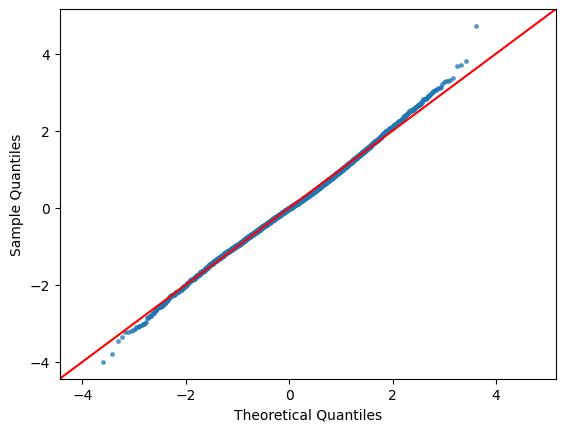

In [96]:
## Assessing normality of residuals Shapiro-Wilk test and QQ-plot
# Null hypothesis: residuals follow a normal distribution
residuals_lr = results_lr.resid
print(shapiro(residuals_lr))
ks_test = kstest(residuals_lr, 'norm', args=(np.mean(residuals_lr), np.std(residuals_lr)))
print(f"Kolmogorov-Smirnov test: Statistic={ks_test.statistic}, p-value={ks_test.pvalue}")
fig = sm.qqplot(residuals_lr, fit=True, line="45", alpha=0.65, markersize=2.5)
plt.show()

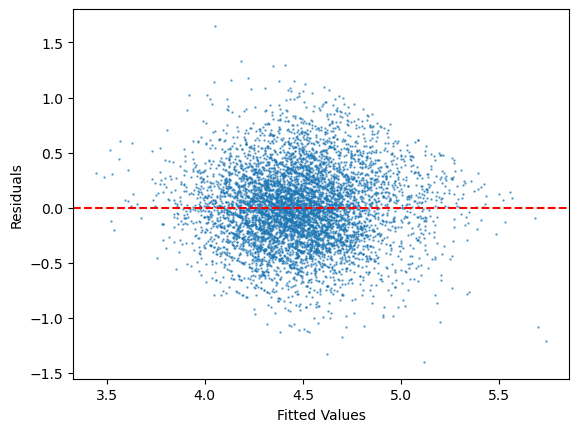

In [97]:
## Assessing linearity: Residual plot
fitted_values_lr = results_lr.fittedvalues
#plt.scatter(fitted_values_lr, np.sqrt(np.abs(residuals_lr/np.std(residuals_lr))), alpha=0.65, s=0.5)
plt.scatter(fitted_values_lr, residuals_lr, alpha=0.65, s=0.5)
plt.axhline(y=0, color='red', label='y=0', linestyle="--", linewidth=1.5)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.show()

C:\Users\mario\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\mario\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


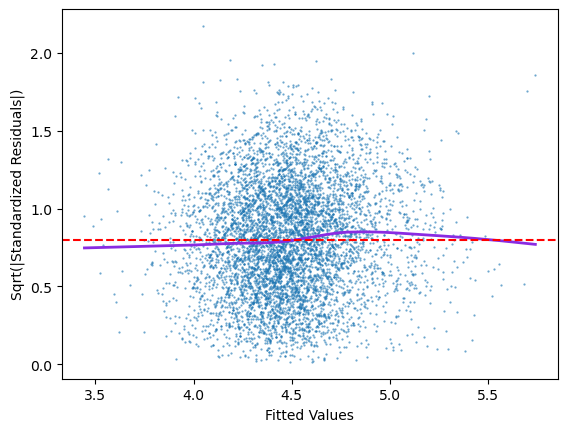

In [98]:
## Assessing homoscedasticity: Residual plot
import seaborn as sns

# Obtain fitted values and residuals from your model
residuals_lr = results_lr.resid

# Standardize residuals
standardized_residuals_lr = residuals_lr / np.std(residuals_lr)

# Compute square root of absolute standardized residuals
sqrt_abs_resid_lr = np.sqrt(np.abs(standardized_residuals_lr))

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Fitted Values': fitted_values_lr,
    'Sqrt Abs Standardized Residuals': sqrt_abs_resid_lr
})

# Create the Scale-Location plot with LOESS line
#plt.figure(figsize=(10, 6))
sns.scatterplot(x='Fitted Values', y='Sqrt Abs Standardized Residuals', data=data, alpha=0.65, s=2, edgecolor='#1f77b4')
sns.regplot(x='Fitted Values', y='Sqrt Abs Standardized Residuals', data=data, scatter=False, 
            lowess=True, color="blueviolet", line_kws=dict(linestyle="-", linewidth=2))
plt.axhline(y=np.sqrt(2/np.pi), color='red', linestyle='--', lw=1.5)
plt.xlabel("Fitted Values")
plt.ylabel("Sqrt(|Standardized Residuals|)")
#plt.title("Scale-Location Plot with LOESS Smoothing")
#plt.legend()
plt.show()

In [99]:
#from statsmodels.stats.diagnostic import het_breuschpagan, spec_white
#het_breuschpagan(residuals_lr, results_lr.model.exog)

In [100]:
### Establishing study case

# Scaled variables: ["TWI", "Bayesian_avg_H", "Bayes_mean_A" , 
# "Bayes_mean_R", "Review_count_H", "Score_H", "location_score"]

# Fitted variables: n_rooms_quant_0 + Hotel_class_3 + Hotel_class_45 + 
# Walkability_num_2 + Walkability_num_4 + Walkability_num_5 + 
# Bayesian_avg_H + Review_count_H'

# Study case to be defined (categorical): n_rooms_quant_0, Hotel_class_3, Hotel_class_45, Walkability_num_2
# Walkability_num_4, Walkability_num_5
# Study case to be defined (numerical): Bayesian_avg_H (var1), Review_count_H (var4)

## Get the scale and center values for variables
# IQR:
scale_value1 = scaler.scale_[1]
scale_value2 = scaler.scale_[2]
scale_value4 = scaler.scale_[4]
scale_value6 = scaler.scale_[6]
scale_value8 = scaler.scale_[8]
scale_value15 = scaler.scale_[15]

# Median:
center_value1 = scaler.center_[1]
center_value2 = scaler.center_[2]
center_value4 = scaler.center_[4]
center_value6 = scaler.center_[6]
center_value8 = scaler.center_[8]
center_value15 = scaler.center_[15]

# Defining values for numerical variables (use following chunk as reference for these values)
# This is the median case
var1 = 4 # Median
var2 = 2 # Median
var4 = 237 # Median
var6 = 4.743389904167741 # Median
var8 = 4.88 # Median
var15 = 16 # Median

# Transform
transformed_value1 = (var1 - center_value1) / scale_value1
transformed_value2 = (var2 - center_value2) / scale_value2
transformed_value4 = (var4 - center_value4) / scale_value4
transformed_value6 = (var6 - center_value6) / scale_value6
transformed_value8 = (var8 - center_value8) / scale_value8
transformed_value15 = (var15 - center_value15) / scale_value15

print("transformed_value1:", transformed_value1, "transformed_value2:", transformed_value2, 
     "transformed_value4:", transformed_value4, "transformed_value6:", transformed_value6,
     "transformed_value8:", transformed_value8, "transformed_value15:", transformed_value15)

transformed_value1: 0.0 transformed_value2: 0.0 transformed_value4: 0.0 transformed_value6: 0.0 transformed_value8: 0.0 transformed_value15: 0.0


In [101]:
model_lr.formula

'avg_price_log ~ Walkability_num_2 + Walkability_num_3 + Walkability_num_4 + Walkability_num_5 + neighbourhood_cleansed_0 + neighbourhood_cleansed_1 + neighbourhood_cleansed_7 + neighbourhood_cleansed_9 + neighbourhood_cleansed_10 + neighbourhood_cleansed_11 + neighbourhood_cleansed_12 + neighbourhood_cleansed_13 + neighbourhood_cleansed_16 + property_type_1 + property_type_2 + property_type_3 + property_type_4 + property_type_5 + property_type_6 + property_type_8 + bathrooms_2 + bathrooms_3 + bedrooms_2 + bedrooms_3 + Parking + Child_Amenities + Bayesian_avg_H + accommodates + availability_365 + minimum_nights + Review_count_H + review_scores_cleanliness'

In [102]:
## Defining study case
study_case = [0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 
             0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 
             0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
             0, 0]

In [103]:
new_data = pd.DataFrame({'const':[1],
                         "Walkability_num_2":study_case[0],
                         "Walkability_num_3":study_case[1],
                         "Walkability_num_4":study_case[2],
                         "Walkability_num_5":study_case[3],
                         "neighbourhood_cleansed_0":study_case[4],
                         "neighbourhood_cleansed_1":study_case[5],
                         "neighbourhood_cleansed_7":study_case[6],
                         "neighbourhood_cleansed_9":study_case[7],
                         "neighbourhood_cleansed_10":study_case[8],
                         "neighbourhood_cleansed_11":study_case[9],
                         "neighbourhood_cleansed_12":study_case[10],
                         "neighbourhood_cleansed_13":study_case[11],
                         "neighbourhood_cleansed_16":study_case[12],
                         "property_type_1":study_case[13],
                         "property_type_2":study_case[14],
                         "property_type_3":study_case[15],
                         "property_type_4":study_case[16],
                         "property_type_5":study_case[17],
                         "property_type_6":study_case[18],
                         "property_type_8":study_case[19],
                         "bathrooms_2":study_case[20],
                         "bathrooms_3":study_case[21],
                         "bedrooms_2":study_case[22],
                         "bedrooms_3":study_case[23],
                         "Parking":study_case[24],
                         "Child_Amenities":study_case[25],
                         "Bayesian_avg_H":study_case[26],
                         "accommodates":study_case[27],
                         "availability_365":study_case[28],
                         "minimum_nights":study_case[29],
                         "Review_count_H":study_case[30],
                         "review_scores_cleanliness":study_case[31],
})

predictions = results_lr.get_prediction(new_data)
df_predictions = predictions.summary_frame()
np.exp(df_predictions)

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,82.928878,1.022944,79.321918,86.699856,41.633064,165.185989


In [104]:
x_walk_score = ["Poor", "Basic", "Average", "High", "Excellent"]
point_estimate_y = [69.214995, 75.666698, 78.340721, 80.0848, 82.928878]

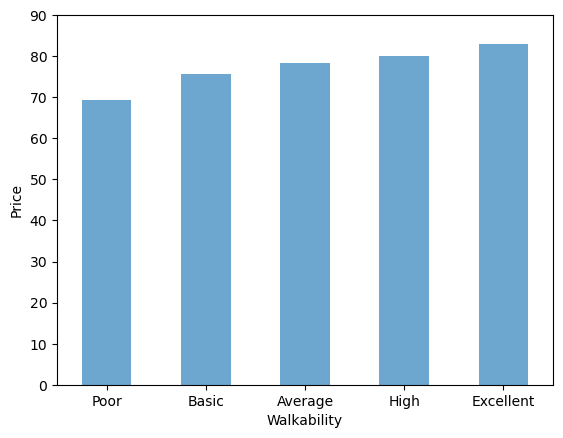

In [105]:
# Create DataFrame
df_point_estimate = pd.DataFrame({
    "Walkability": x_walk_score,
    "point_estimate_y": point_estimate_y,
})

# Plot the DataFrame
ax = df_point_estimate.plot.bar(x="Walkability", y="point_estimate_y", 
                 color=["#1f77b4"], alpha=0.65, 
                 xlabel="Walkability", ylabel="Price", rot=0, legend=False)
ax.set_ylim([0, 90])

# Add labels and title
plt.xlabel("Walkability")
plt.ylabel("Price")
#plt.title("Comparison of Counts by Walkability Levels")

# Show plot
plt.show()

In [106]:
# import the regressor 
from sklearn.tree import DecisionTreeRegressor, export_graphviz  
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [107]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Create a regressor object 
## Using GridSearchCV over min_samples_leaf
regressor = DecisionTreeRegressor(random_state = 42)

# Define X and y data 
df_dummies_dropna = df_dummies_no_scale.dropna(subset="price")
var_considered = ["Metro_Tram_stop", 'neighbourhood_cleansed_0',
                   'neighbourhood_cleansed_1', 'neighbourhood_cleansed_2',
                   'neighbourhood_cleansed_3', 'neighbourhood_cleansed_4',
                   'neighbourhood_cleansed_5', 'neighbourhood_cleansed_6',
                   'neighbourhood_cleansed_7', 'neighbourhood_cleansed_8',
                   'neighbourhood_cleansed_9', 'neighbourhood_cleansed_10',
                   'neighbourhood_cleansed_11', 'neighbourhood_cleansed_12',
                   'neighbourhood_cleansed_13', 'neighbourhood_cleansed_14',
                   'neighbourhood_cleansed_15', "neighbourhood_cleansed_16", 'property_type_0', 'property_type_1',
                   'property_type_2', 'property_type_3', 'property_type_4',
                   'property_type_5', 'property_type_6', 'property_type_7',
                   'property_type_8', 
                   "bathrooms_1", "bathrooms_2", 
                      "bathrooms_3",  "bedrooms_2", "bedrooms_3",  
                      "beds_2", "beds_3",  'TVs', 'Wifi', 'Kitchen_Appliances', 'Parking',
       'Child_Amenities', 'Bathroom_Amenities', 'Entertainment_Systems', 'Miscellaneous', 
              "TWI", 
          "Bayesian_avg_H", "location_score", "accommodates",  
                   "availability_365", "maximum_nights", "minimum_nights", 
                  "Bayes_mean_A", "Bayes_mean_R", "Review_count_H", "review_scores_cleanliness", "amenities_count"]
X=df_dummies_dropna[var_considered]

# "Closeness_Centrality_Restaurants", "Closeness_Centrality_Restaurants",
y=df_dummies_dropna.price

# Split the data into training and testing sets (80-20 split)
#X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the grid for min_samples_leaf
#param_grid = {"min_samples_leaf":[2]} # 
param_grid = {
    #'max_depth': range(1, 2), # np.arange(5, 10)
    #'min_samples_split': np.arange(10, 100),
    'min_samples_leaf': range(20, 50) #[10, 20, 50, 100] #range(5, 10) # np.arange(5, 15)
}

# Set up the grid search with cross-validation
grid_search = GridSearchCV(estimator=regressor, param_grid=param_grid, cv=5, scoring="r2") #"neg_mean_squared_error"

# Fit the grid search to the data
grid_search.fit(X, y)

# Get the best parameter value
#best_max_depth = grid_search.best_params_["max_depth"]
#best_min_samples_split = grid_search.best_params_["min_samples_split"]
best_min_samples_leaf = grid_search.best_params_["min_samples_leaf"]
#print(f"Best max_depth: {best_max_depth}")
#print(f"Best min_samples_split: {best_min_samples_split}")
print(f"Best min_samples_leaf: {best_min_samples_leaf}")

# Fit the final model with the best min_samples_leaf
#final_model = DecisionTreeRegressor(max_depth = best_max_depth, 
#                                    min_samples_leaf=best_min_samples_leaf)

final_model = DecisionTreeRegressor(min_samples_leaf=best_min_samples_leaf)

final_model.fit(X, y)

# Predict the entire dataset
y_pred = final_model.predict(X)

# Calculate evalation metrics
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)

#mse_scores = -cross_val_score(final_model, X, y, cv=5, scoring="neg_mean_squared_error")
#r2_scores = cross_val_score(final_model, X, y, cv=5, scoring="r2")

# Calculate mean and std of MSE
#mean_mse_scores = np.mean(mse_scores)
#std_mse_scores = np.std(mse_scores)
#mean_r2_scores = np.mean(r2_scores)
#std_r2_scores = np.std(r2_scores)

#print(f"Mean MSE: {mean_mse_scores}")
#print(f"Std MSE: {std_mse_scores}")
#print(f"Mean R^2: {mean_r2_scores}")
#print(f"Std R^2: {std_r2_scores}")

print(f"MSE: {mse}")
print(f"R^2: {r2}")
print(f"Adj R^2: {1-(1-r2)*(len(X)-1)/(len(X)-len(var_considered)-1)}")

Best min_samples_leaf: 32
MSE: 1306.01768437672
R^2: 0.423347324090808
Adj R^2: 0.41853668845059533


In [108]:
print("mean_test_score:" , grid_search.cv_results_["mean_test_score"][np.argmin(grid_search.cv_results_["rank_test_score"])])
print("std_test_score:" , grid_search.cv_results_["std_test_score"][np.argmin(grid_search.cv_results_["rank_test_score"])])
print("rank_test_score:" , grid_search.cv_results_["rank_test_score"][np.argmin(grid_search.cv_results_["rank_test_score"])])

mean_test_score: 0.2700637180066018
std_test_score: 0.020262969467120313
rank_test_score: 1


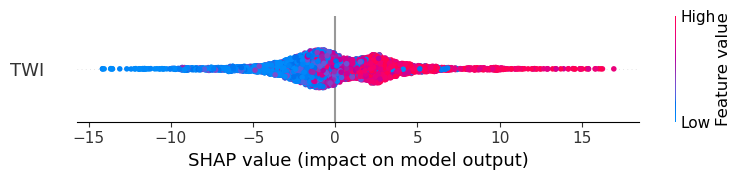

In [109]:
import shap
explainer = shap.Explainer(final_model)
shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X, max_display=50)
shap.summary_plot(shap_values[:,42:43], X.iloc[:, 42:43], max_display=50)

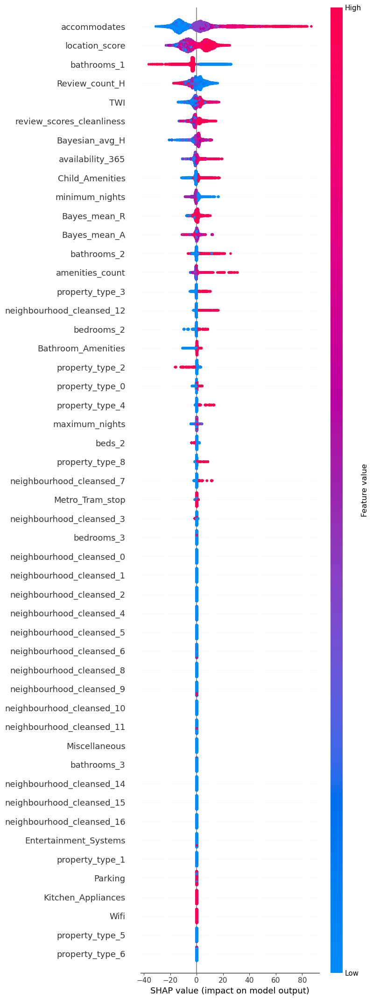

In [110]:
shap.summary_plot(shap_values, X, max_display=50)

In [111]:
# Predict on the testing data (if train_test_split in the previous chunk is uncommented)
#y_pred = final_model.predict(X_test)

# Calculate evaluation metrics on the testing data
#mse = mean_squared_error(y_test, y_pred)
#r2 = r2_score(y_test, y_pred)
#adj_r2 = 1 - (1 - r2) * (len(y_test) - 1) / (len(y_test) - len(var_considered) - 1)

#print(f"MSE: {mse}")
#print(f"R^2: {r2}")
#print(f"Adjusted R^2: {adj_r2}")

In [112]:
# Feature importance
j = 0
var_considered_filtered = []
for feature in var_considered:
    print(feature, final_model.feature_importances_[j])
    
    if final_model.feature_importances_[j] >= 0:
        var_considered_filtered.append(feature)
        
    j += 1

Metro_Tram_stop 0.00023374975711283258
neighbourhood_cleansed_0 0.0
neighbourhood_cleansed_1 0.0
neighbourhood_cleansed_2 0.0
neighbourhood_cleansed_3 0.00022084173337367924
neighbourhood_cleansed_4 0.0
neighbourhood_cleansed_5 0.0
neighbourhood_cleansed_6 0.0
neighbourhood_cleansed_7 0.0044432626662862474
neighbourhood_cleansed_8 0.0
neighbourhood_cleansed_9 0.0
neighbourhood_cleansed_10 0.0
neighbourhood_cleansed_11 0.0
neighbourhood_cleansed_12 0.007112334300131458
neighbourhood_cleansed_13 0.0
neighbourhood_cleansed_14 0.0
neighbourhood_cleansed_15 0.0
neighbourhood_cleansed_16 0.0
property_type_0 0.0025001273840301705
property_type_1 0.0
property_type_2 0.006062962624281072
property_type_3 0.0061747222617277156
property_type_4 0.002610524765541801
property_type_5 0.0
property_type_6 0.0
property_type_7 0.0
property_type_8 0.0017076618552567338
bathrooms_1 0.12188003415521369
bathrooms_2 0.020700690370405218
bathrooms_3 0.0
bedrooms_2 0.005977323765557199
bedrooms_3 0.0
beds_2 0.00

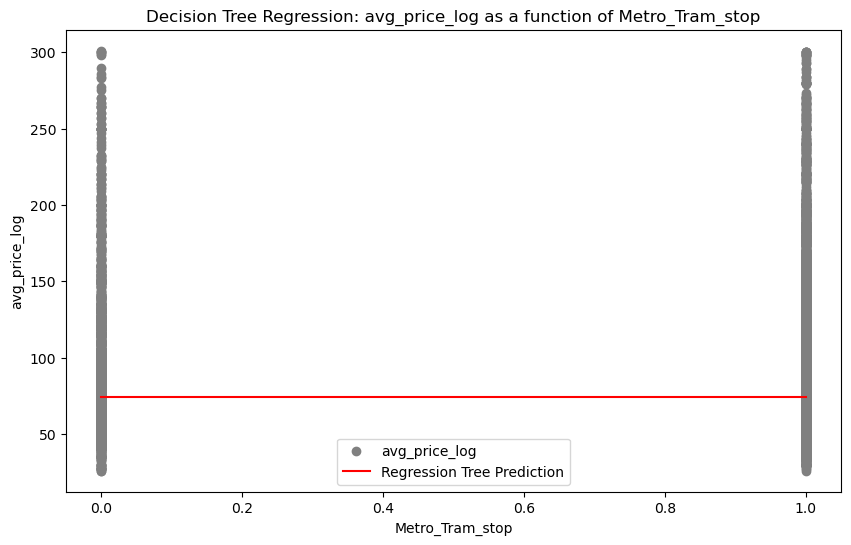

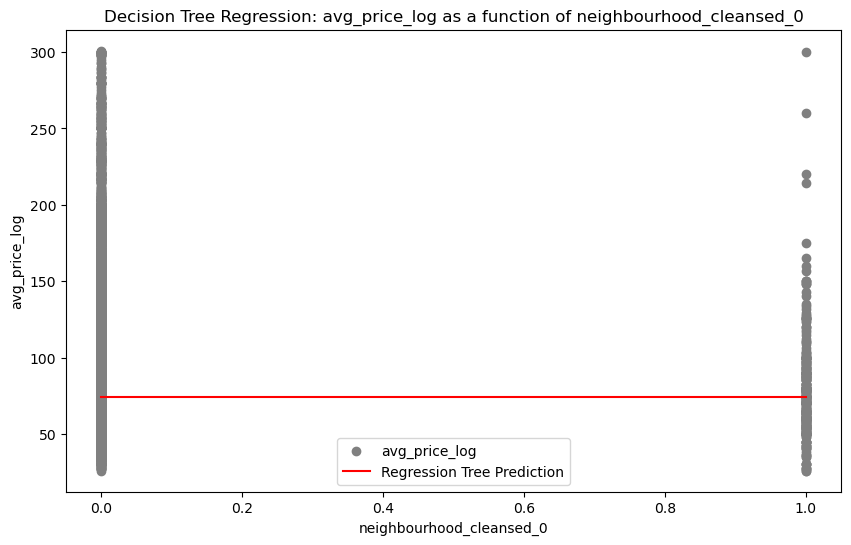

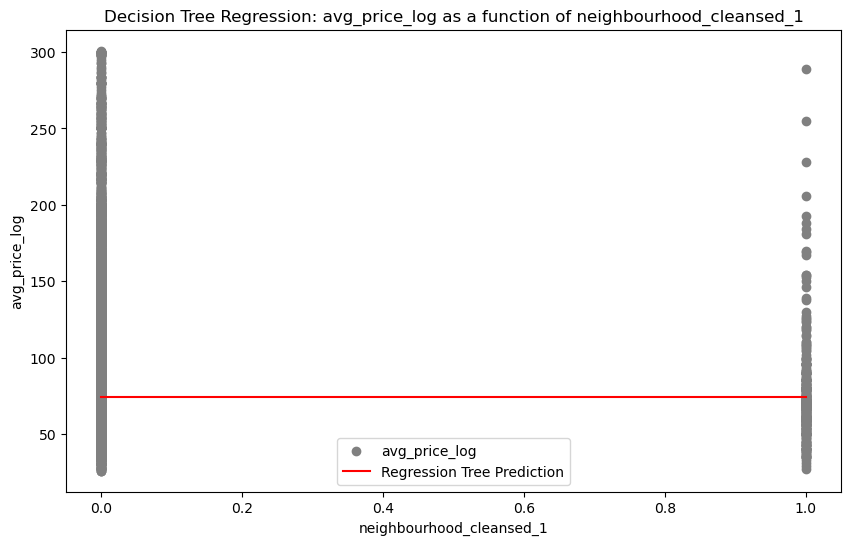

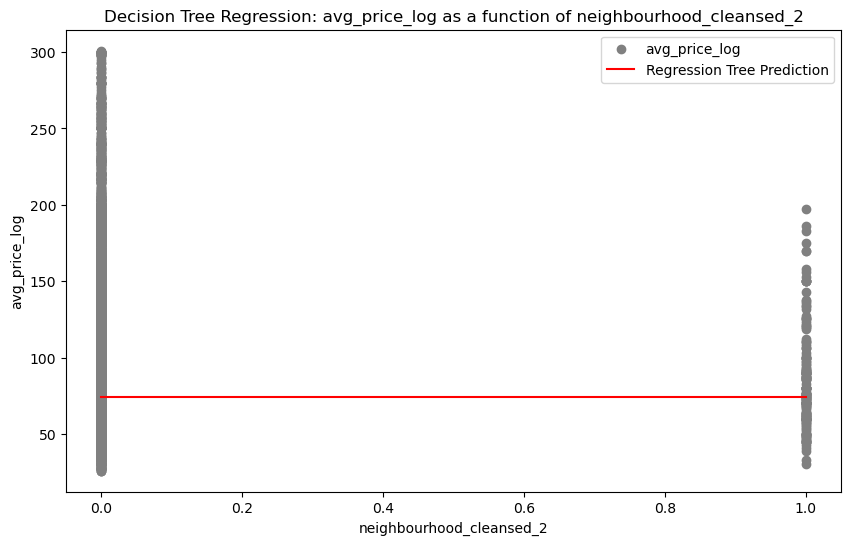

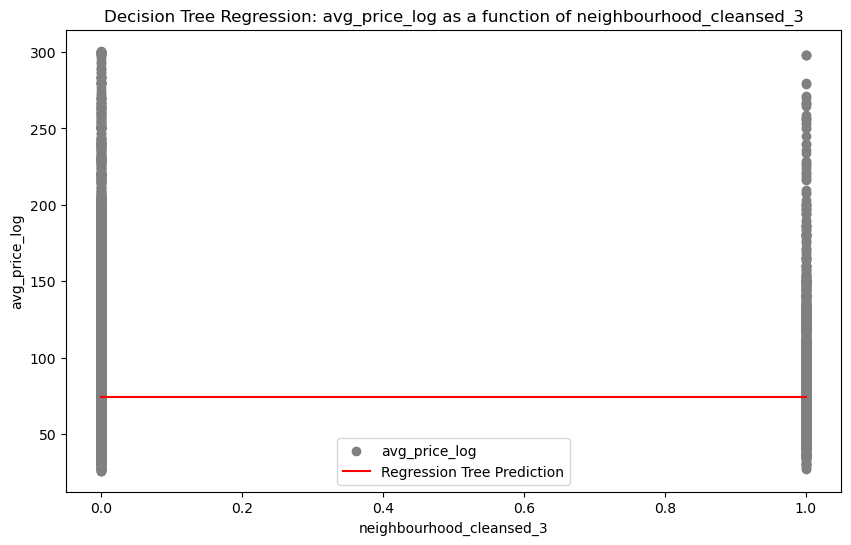

...

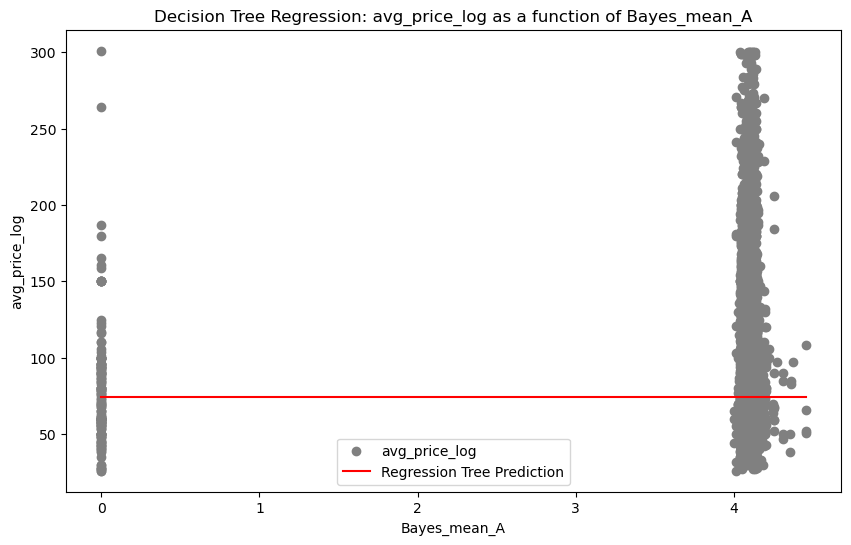

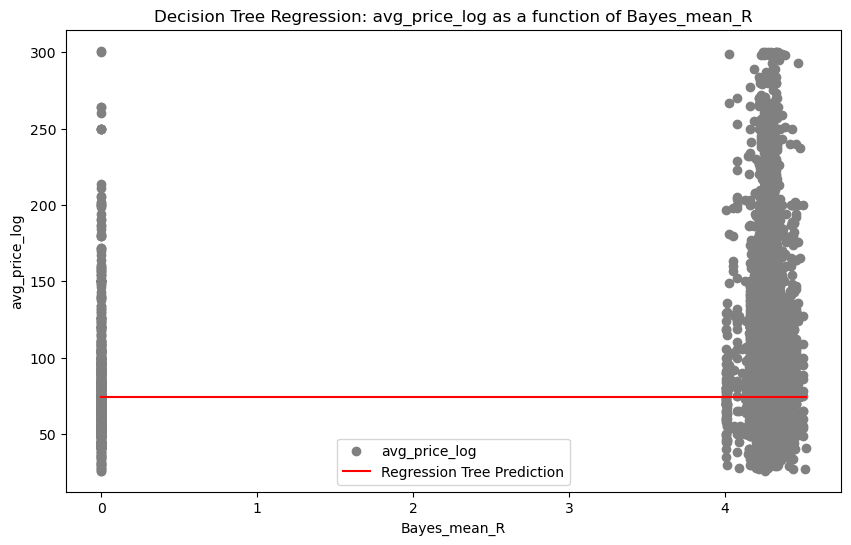

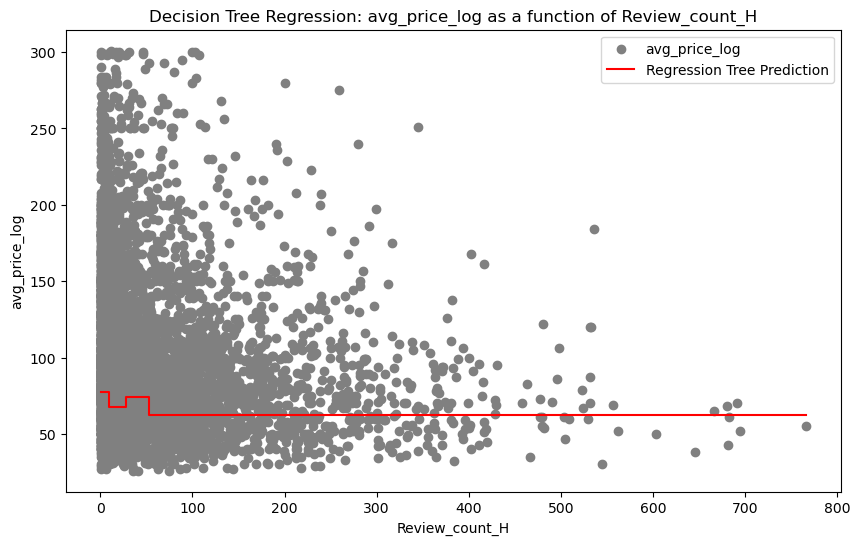

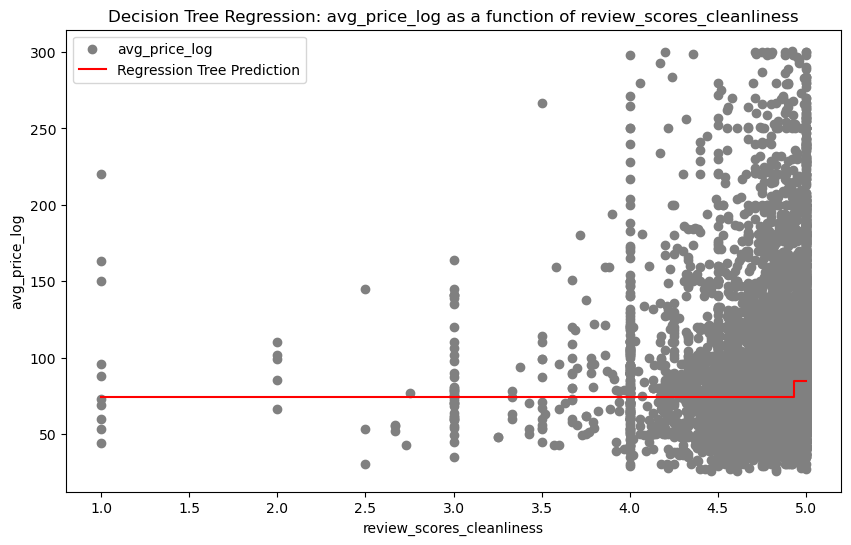

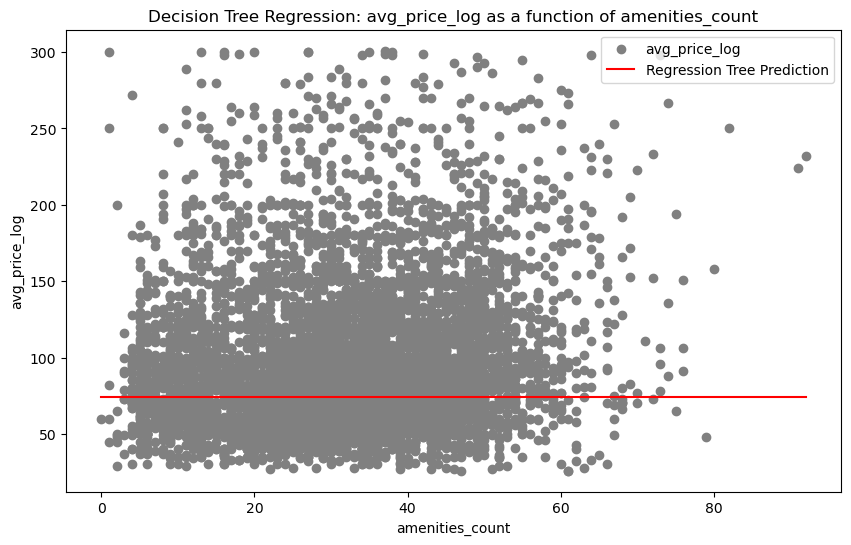

In [113]:
# Function to plot the decision tree predictions for a given feature
def plot_feature_decision_boundary(feature_name, output_label):
    plt.figure(figsize=(10, 6))

    # Scatter plot of the feature vs avg_price
    plt.scatter(X[feature_name], y, color='gray', label=output_label)

    # Create a grid of feature values
    feature_values = np.linspace(X[feature_name].min(), X[feature_name].max(), 500)

    # Create a grid of input features
    X_grid = pd.DataFrame(np.tile(X.mean().values, (500, 1)), columns=X.columns)
    X_grid[feature_name] = feature_values

    # Predict avg_price for the grid values
    y_grid_pred = final_model.predict(X_grid)

    # Plot the decision boundary
    plt.step(feature_values, y_grid_pred, color='red', label='Regression Tree Prediction', where='mid')

    plt.xlabel(feature_name)
    plt.ylabel(output_label)
    plt.title(f"Decision Tree Regression: {output_label} as a function of {feature_name}")
    plt.legend()
    plt.show()

# Plot decision boundaries for each feature
for feature in var_considered_filtered:
    plot_feature_decision_boundary(feature, "avg_price_log")

In [114]:
# export the decision tree to a tree.dot file 
# for visualizing the plot easily anywhere 
# https://dreampuf.github.io/GraphvizOnline/#digraph%20Tree%20%7B%0D%0Anode%20%5Bshape%3Dbox%2C%20fontname%3D%22helvetica%22%5D%20%3B%0D%0Aedge%20%5Bfontname%3D%22helvetica%22%5D%20%3B%0D%0A0%20%5Blabel%3D%22TWI%20%3C%3D%208.771%5Cnsquared_error%20%3D%20454.476%5Cnsamples%20%3D%2018%5Cnvalue%20%3D%20117.694%22%5D%20%3B%0D%0A1%20%5Blabel%3D%22Hotel_class_23%20%3C%3D%200.5%5Cnsquared_error%20%3D%2062.776%5Cnsamples%20%3D%207%5Cnvalue%20%3D%2098.286%22%5D%20%3B%0D%0A0%20-%3E%201%20%5Blabeldistance%3D2.5%2C%20labelangle%3D45%2C%20headlabel%3D%22True%22%5D%20%3B%0D%0A2%20%5Blabel%3D%22TWI%20%3C%3D%200.954%5Cnsquared_error%20%3D%2019.297%5Cnsamples%20%3D%204%5Cnvalue%20%3D%20104.375%22%5D%20%3B%0D%0A1%20-%3E%202%20%3B%0D%0A3%20%5Blabel%3D%22squared_error%20%3D%2033.062%5Cnsamples%20%3D%202%5Cnvalue%20%3D%20102.75%22%5D%20%3B%0D%0A2%20-%3E%203%20%3B%0D%0A4%20%5Blabel%3D%22squared_error%20%3D%200.25%5Cnsamples%20%3D%202%5Cnvalue%20%3D%20106.0%22%5D%20%3B%0D%0A2%20-%3E%204%20%3B%0D%0A5%20%5Blabel%3D%22squared_error%20%3D%205.389%5Cnsamples%20%3D%203%5Cnvalue%20%3D%2090.167%22%5D%20%3B%0D%0A1%20-%3E%205%20%3B%0D%0A6%20%5Blabel%3D%22Hotel_class_23%20%3C%3D%200.5%5Cnsquared_error%20%3D%20311.475%5Cnsamples%20%3D%2011%5Cnvalue%20%3D%20130.045%22%5D%20%3B%0D%0A0%20-%3E%206%20%5Blabeldistance%3D2.5%2C%20labelangle%3D-45%2C%20headlabel%3D%22False%22%5D%20%3B%0D%0A7%20%5Blabel%3D%22squared_error%20%3D%20269.389%5Cnsamples%20%3D%203%5Cnvalue%20%3D%20150.333%22%5D%20%3B%0D%0A6%20-%3E%207%20%3B%0D%0A8%20%5Blabel%3D%22TWI%20%3C%3D%2059.023%5Cnsquared_error%20%3D%20115.027%5Cnsamples%20%3D%208%5Cnvalue%20%3D%20122.438%22%5D%20%3B%0D%0A6%20-%3E%208%20%3B%0D%0A9%20%5Blabel%3D%22TWI%20%3C%3D%2039.613%5Cnsquared_error%20%3D%204.922%5Cnsamples%20%3D%204%5Cnvalue%20%3D%20129.625%22%5D%20%3B%0D%0A8%20-%3E%209%20%3B%0D%0A10%20%5Blabel%3D%22squared_error%20%3D%200.562%5Cnsamples%20%3D%202%5Cnvalue%20%3D%20129.25%22%5D%20%3B%0D%0A9%20-%3E%2010%20%3B%0D%0A11%20%5Blabel%3D%22squared_error%20%3D%209.0%5Cnsamples%20%3D%202%5Cnvalue%20%3D%20130.0%22%5D%20%3B%0D%0A9%20-%3E%2011%20%3B%0D%0A12%20%5Blabel%3D%22TWI%20%3C%3D%2071.824%5Cnsquared_error%20%3D%20121.812%5Cnsamples%20%3D%204%5Cnvalue%20%3D%20115.25%22%5D%20%3B%0D%0A8%20-%3E%2012%20%3B%0D%0A13%20%5Blabel%3D%22squared_error%20%3D%20240.25%5Cnsamples%20%3D%202%5Cnvalue%20%3D%20114.5%22%5D%20%3B%0D%0A12%20-%3E%2013%20%3B%0D%0A14%20%5Blabel%3D%22squared_error%20%3D%202.25%5Cnsamples%20%3D%202%5Cnvalue%20%3D%20116.0%22%5D%20%3B%0D%0A12%20-%3E%2014%20%3B%0D%0A%7D
export_graphviz(final_model, out_file ='tree_Napoli_price_airbnb.dot', 
               feature_names = var_considered)  

#### GAM

In [187]:
GAM_fit = True
#if GAM_fit:
#    X, X_test, y, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

GAM R²: 0.41171167834223044


C:\Users\mario\AppData\Local\Temp\ipykernel_1588\2187206854.py:27: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  plt.tight_layout()


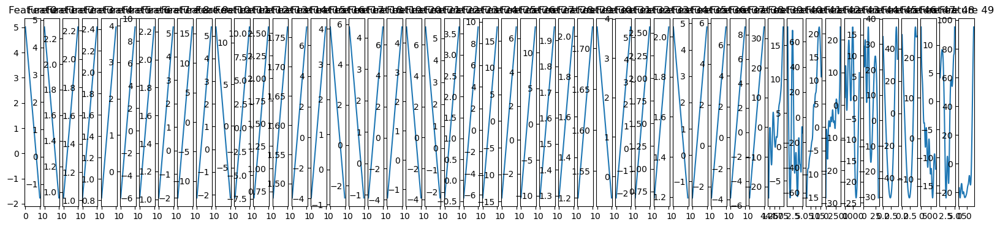

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      149.87
Link Function:                     IdentityLink Log Likelihood:                                -53119.8852
Number of Samples:                         6528 AIC:                                           106541.5104
                                                AICc:                                          106548.6974
                                                GCV:                                             1422.3321
                                                Scale:                                           1363.6777
                                                Pseudo R-Squared:                                   0.4117
Feature Function                  Lam

C:\Users\mario\AppData\Local\Temp\ipykernel_1588\2187206854.py:29: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


In [189]:
# Install pyGAM
# !pip install pygam
if GAM_fit:
    from pygam import LinearGAM, s, f, l
    df_dummies_dropna = df_dummies_no_scale.dropna(subset="price")
    # The variables after VIF in linear regression
    var_considered = ["neighbourhood_cleansed_0", "neighbourhood_cleansed_1", "neighbourhood_cleansed_2", "neighbourhood_cleansed_4", "neighbourhood_cleansed_5", "neighbourhood_cleansed_6", "neighbourhood_cleansed_7", "neighbourhood_cleansed_8", "neighbourhood_cleansed_9", "neighbourhood_cleansed_10", "neighbourhood_cleansed_11", "neighbourhood_cleansed_12", "neighbourhood_cleansed_13", "neighbourhood_cleansed_14", "neighbourhood_cleansed_15", "neighbourhood_cleansed_16", "property_type_1", "property_type_2", "property_type_3", "property_type_4", "property_type_5", "property_type_6", "property_type_7", "property_type_8", "bathrooms_2", "bathrooms_3", "bedrooms_2", "bedrooms_3", "beds_2", "beds_3", "TVs", "Parking", "Child_Amenities", "Entertainment_Systems", "Miscellaneous", "Walkability_num_2", "Walkability_num_3", "Walkability_num_4", "Walkability_num_5", "Bayesian_avg_H", "location_score", "accommodates", "availability_365", "maximum_nights", "minimum_nights", "Bayes_mean_A", "Bayes_mean_R", "Review_count_H", "review_scores_cleanliness", "amenities_count"]
    X=df_dummies_dropna[var_considered]
    y=df_dummies_dropna.price
    


    gam = LinearGAM(s(0) + s(1) + s(2) + s(3) + s(4) + s(5) + s(6) + s(7) + s(8) + s(9) + s(10) + s(11) + s(12) + s(13) + s(14) + s(15) + s(16) + s(17) + s(18) + s(19) + s(20) + s(21) + s(22) + s(23) + s(24) + s(25) + s(26) + s(27) + s(28) + s(29) + s(30) + s(31) + s(32) + s(33) + s(34) + s(35) + s(36) + s(37) + s(38) + s(39) + s(40) + s(41) + s(42) + s(43) + s(44) + s(45) + s(46) + s(47) + s(48) + s(49)).fit(X, y)

    #y_pred_gam = gam.predict(X_test)
    y_pred_gam = gam.predict(X)
    #r2_gam = r2_score(y_test, y_pred_gam)
    r2_gam = r2_score(y, y_pred_gam)
    print(f"GAM R²: {r2_gam}")

    # Plot the partial dependence
    fig, axs = plt.subplots(1, X.shape[1], figsize=(20, 4))
    for i, ax in enumerate(axs):
        XX = gam.generate_X_grid(term=i)
        ax.plot(XX[:, i], gam.partial_dependence(term=i, X=XX))
        ax.set_title(f'Feature {i}')
    plt.tight_layout()
    plt.show()
    print(gam.summary())

#### Gradient Boosting

In [132]:
import warnings
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

warnings.filterwarnings("ignore", category=DeprecationWarning)

# Define X and y data 
df_dummies_dropna = df_dummies.dropna(subset=["price"])


X = df_dummies_dropna[var_considered]
y = df_dummies_dropna["price"]

# Split the data into training and testing sets (80-20 split)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the grid for Gradient Boosting parameters
param_grid = {
    'n_estimators': [50, 100, 500],
    'learning_rate': [0.01, 0.1],
    #'max_depth': np.arange(3, 15),
    'min_samples_leaf': np.arange(20, 50)
}

# Create a Gradient Boosting regressor object
gb_regressor = GradientBoostingRegressor(random_state=42)

# Set up the grid search with cross-validation
grid_search = GridSearchCV(estimator=gb_regressor, param_grid=param_grid, cv=5, scoring="r2")

# Fit the grid search to the data
#grid_search.fit(X_train, y_train)
grid_search.fit(X, y)

# Get the best parameter values
best_n_estimators = grid_search.best_params_["n_estimators"]
best_learning_rate = grid_search.best_params_["learning_rate"]
#best_max_depth = grid_search.best_params_["max_depth"]
best_min_samples_leaf = grid_search.best_params_["min_samples_leaf"]

print(f"Best n_estimators: {best_n_estimators}")
print(f"Best learning_rate: {best_learning_rate}")
#print(f"Best max_depth: {best_max_depth}")
print(f"Best min_samples_leaf: {best_min_samples_leaf}")

# Fit the final model with the best parameters
final_model = GradientBoostingRegressor(
    n_estimators=best_n_estimators, 
    learning_rate=best_learning_rate,
    #max_depth=best_max_depth,
    min_samples_leaf=best_min_samples_leaf,
    random_state=42
)
#final_model.fit(X_train, y_train)
final_model.fit(X, y)

# Predict the test set
#y_pred = final_model.predict(X_test)
y_pred = final_model.predict(X)

# Calculate evaluation metrics
#mse = mean_squared_error(y_test, y_pred)
#r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y, y_pred)
r2 = r2_score(y, y_pred)
adj_r2 = 1 - (1 - r2) * (len(y) - 1) / (len(y) - len(var_considered) - 1)

print(f"MSE: {mse}")
print(f"R^2: {r2}")
print(f"Adj R^2: {adj_r2}")

Best n_estimators: 500
Best learning_rate: 0.1
Best min_samples_leaf: 38
MSE: 918.58011271208
R^2: 0.5944146190599391
Adj R^2: 0.5910310858341143


In [133]:
print("mean_test_score:" , grid_search.cv_results_["mean_test_score"][np.argmin(grid_search.cv_results_["rank_test_score"])])
print("std_test_score:" , grid_search.cv_results_["std_test_score"][np.argmin(grid_search.cv_results_["rank_test_score"])])
print("rank_test_score:" , grid_search.cv_results_["rank_test_score"][np.argmin(grid_search.cv_results_["rank_test_score"])])

mean_test_score: 0.3985131986074183
std_test_score: 0.012162900111505118
rank_test_score: 1


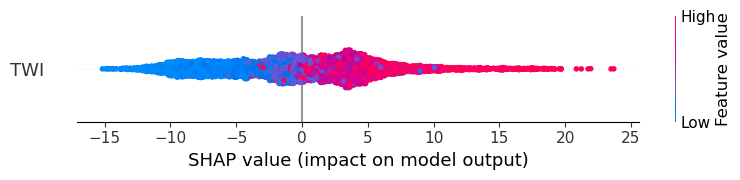

In [134]:
import shap
explainer = shap.Explainer(final_model)
shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X, max_display=50)
shap.summary_plot(shap_values[:,42:43], X.iloc[:, 42:43], max_display=50)

#### Isochrone maps

C:\Users\mario\AppData\Local\Temp\ipykernel_1352\2527265162.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap_var)


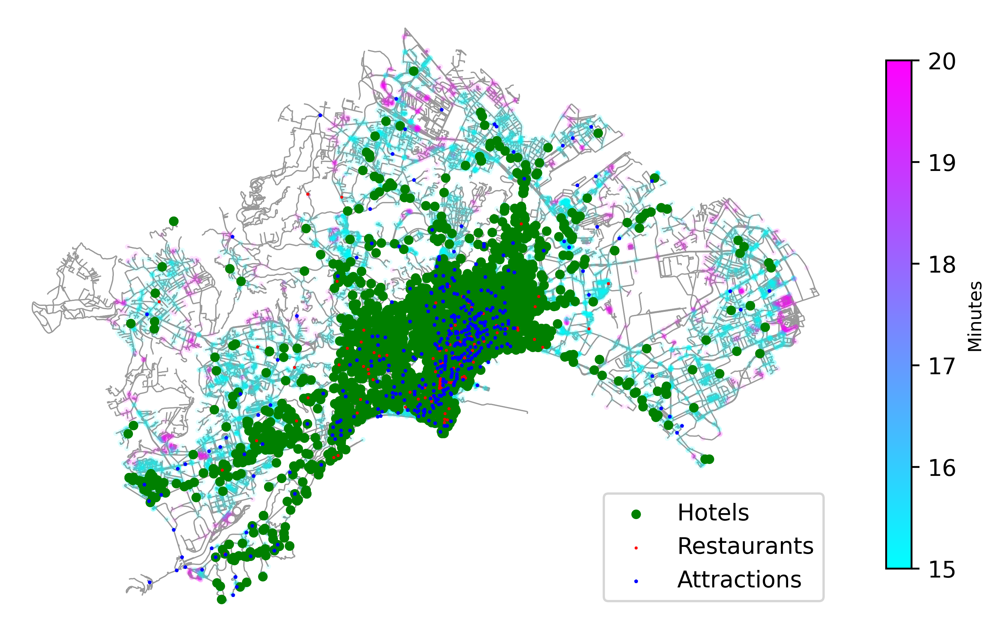

In [73]:
G2 = G
trip_times = [X_minutes, 20]  # in minutes

cmap_var = "cool" #"winter"
# add an edge attribute for time in minutes required to traverse each edge
for _, _, _, data in G2.edges(data=True, keys=True):
    data["time"] = data["length"] / speed_mm
    
# get one color for each isochrone (r, g, b, alpha)
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap=cmap_var, start=1, stop=0, alpha = 1)
# color the nodes according to isochrone then plot the street network
node_colors = {}
node_time = {}

for center_node in hotels_df["id_nearest_node_H"]:
    for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
        subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance="time")
        for node in subgraph.nodes():
            if node in node_time and trip_time < node_time[node]:
                node_colors[node] = color
                node_time[node] = trip_time
            elif node not in node_time:
                node_colors[node] = color
                node_time[node] = trip_time
nc = [node_colors[node] if node in node_colors else "none" for node in G2.nodes()]
ns = [5 if node in node_colors else 0 for node in G2.nodes()]
mpl.rcParams['figure.dpi'] = 500

cmap = plt.cm.get_cmap(cmap_var)
norm=plt.Normalize(vmin=np.min(trip_times), vmax=np.max(trip_times))
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])


fig, ax = ox.plot_graph(G2, node_color=nc, node_size=ns, node_alpha=0.1,
                        edge_linewidth=0.5, edge_color="#999999", bgcolor="white", 
                        show=False, close=False)

    
# Adding Hotels, Restaurants, Attractions, and Tram/Metro stations
ax.scatter(hotels_df["x_nearest_node_H"].values, hotels_df["y_nearest_node_H"].values, 
           color='green', s=10, zorder=2, marker = 'o', label="Hotels")
ax.scatter(top_k_R_df["x_nearest_node_R"].values, top_k_R_df["y_nearest_node_R"].values, 
           color='red', s=0.1, zorder=2, marker = 's', label="Restaurants")
ax.scatter(top_k_A_df["x_nearest_node_A"].values, top_k_A_df["y_nearest_node_A"].values, 
           color='blue', s=0.5, zorder=2, marker = '*', label="Attractions")
ax.legend(loc='lower right')

cb = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', shrink = 0.5)
cb.set_label('Minutes', fontsize = 8)

plt.show()

C:\Users\mario\AppData\Local\Temp\ipykernel_16300\3068561464.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap(cmap_var)


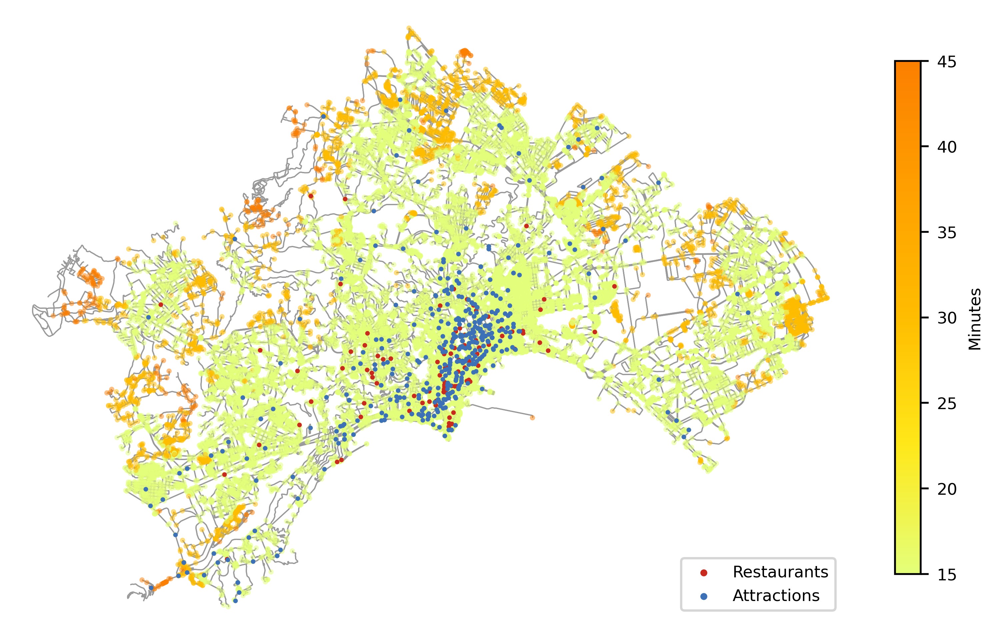

In [65]:
G2 = G
trip_times = [X_minutes, 30, 45]  # in minutes

cmap_var = "Wistia"#"Greens" #"Wistia"  #"summer" #
# add an edge attribute for time in minutes required to traverse each edge
for _, _, _, data in G2.edges(data=True, keys=True):
    data["time"] = data["length"] / speed_mm
    
# get one color for each isochrone (r, g, b, alpha)
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap=cmap_var, start=1, stop=0, alpha = 1)
# color the nodes according to isochrone then plot the street network
node_colors = {}
node_time = {}

for center_node in hotels_df["id_nearest_node_H"]:
    for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
        subgraph = nx.ego_graph(G2, center_node, radius=trip_time, distance="time")
        for node in subgraph.nodes():
            if node in node_time and trip_time < node_time[node]:
                node_colors[node] = color
                node_time[node] = trip_time
            elif node not in node_time:
                node_colors[node] = color
                node_time[node] = trip_time
nc = [node_colors[node] if node in node_colors else "none" for node in G2.nodes()]
ns = [5 if node in node_colors else 0 for node in G2.nodes()]
mpl.rcParams['figure.dpi'] = 500

cmap = plt.cm.get_cmap(cmap_var)
norm = plt.Normalize(vmin=np.min(trip_times), vmax=np.max(trip_times))
sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])


fig, ax = ox.plot_graph(G2, node_color=nc, node_size=ns, node_alpha=0.5,
                        edge_linewidth=0.5, edge_color="#999999", bgcolor="white", 
                        show=False, close=False)

    
# Adding Hotels, Restaurants, Attractions, and Tram/Metro stations
#ax.scatter(hotels_df["x_nearest_node_H"].values, hotels_df["y_nearest_node_H"].values, 
#           color='green', s=10, zorder=2, marker = 'o', label="Hotels")
ax.scatter(top_k_R_df["x_nearest_node_R"].values, top_k_R_df["y_nearest_node_R"].values, 
           color='#c82a1d', s=1, zorder=2, marker = 'o', label="Restaurants")
ax.scatter(top_k_A_df["x_nearest_node_A"].values, top_k_A_df["y_nearest_node_A"].values, 
           color='#3c71b7', s=1, zorder=2, marker = 'o', label="Attractions")
ax.legend(loc='lower right', fontsize = "x-small", markerscale = 2)

cb = fig.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', shrink = 0.5)
cb.ax.tick_params(labelsize=7)
cb.set_label('Minutes', fontsize = 7)

plt.show()

In [66]:
df.Walkability.value_counts()

Walkability
Poor        2564
High        1559
Excelent    1014
Basic        965
Average      918
Name: count, dtype: int64

#### For plotting some auxiliary images

In [ ]:
import osmnx as ox
import matplotlib as mpl


location_point = (45.3986490196774, 11.874350466689211)

place_name = "Padova, Italy"

mpl.rcParams['figure.dpi'] = 500
# create network from point, inside bounding box of N, S, E, W each 750m from point
#plt.title("Padova: All street network'")
#G_walk = ox.graph_from_point(location_point, dist=dist, dist_type="bbox", network_type="walk", simplify = False)

#Drive network
G_walk = ox.graph_from_point(location_point, dist=300, dist_type="bbox", network_type="walk", simplify = False)
#G_drive = ox.graph_from_place(place_name, network_type="walk", retain_all=True, simplify = False)

fig, ax = ox.plot_graph(G_walk, node_color="white", edge_color="gray", node_edgecolor = "blue",
                        edge_linewidth=1, node_size=1.5, bgcolor="white", 
                        figsize=(6, 6)) 

In [ ]:
plt.style.use('default')
xx = np.linspace(0, 10000, 10000)
zz_avg = 500
yy = xx/(xx + zz_avg)
fig,ax=plt.subplots(1,1)
ax.plot(xx, yy)
ax.plot(xx, (1-yy))
ax.set_ylabel("Weight value")
ax.set_xlabel("Number of reviews")
ax.legend(["POI review score weight", "Average of review scores weight"])
ax.axvline(x=zz_avg, ymax=0.5, linestyle = "--", color="gray")
ax.axhline(y=1, linestyle = "dotted", color="gray")
ax.axhline(y=0, linestyle = "dotted", color="gray")
ax.set_xticks([0, 500, 2000, 4000, 6000, 8000, 10000])

In [ ]:
fig, ax = plt.subplots(1,1)
ax.plot(xx, yy*4.5 + (1-yy)*3)
ax.plot(xx, yy*3.5 + (1-yy)*3)
ax.axhline(y=4.5, linestyle = "dotted", color="#1f77b4") 
ax.axhline(y=3.5, linestyle = "dotted", color="#ff7f0e")
ax.set_yticks(np.arange(3, 5, 0.5))
ax.set_ylim([3, 4.6])
ax.set_xticks([0, 2000, 4000, 6000, 8000, 10000])
ax.set_ylabel("Bayesian average value")
ax.set_xlabel("Number of reviews")
ax.legend(["POI with review score 4.5", "POI with review score 3.5"])